# Install MMSegmentation

In [ ]:
!nvidia-smi # Tesla P100이 출력되지 않으면 "런타임 초기화"

Mon Jun  6 09:19:39 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   39C    P8     9W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())

1.11.0+cu113 True


In [ ]:
# Install MMCV
!pip install mmcv-full -f https://download.openmmlab.com/mmcv/dist/cu111/torch1.10.0/index.html

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.openmmlab.com/mmcv/dist/cu111/torch1.10.0/index.html
     |████████████████████████████████| 46.4 MB 2.0 MB/s 
     |████████████████████████████████| 190 kB 5.3 MB/s 


In [ ]:
!rm -rf mmsegmentation
!git clone https://github.com/museonghwang/mmsegmentation.git
#!git clone https://github.com/open-mmlab/mmsegmentation.git 
%cd mmsegmentation
!pip install -e .

Cloning into 'mmsegmentation'...
remote: Enumerating objects: 7003, done.
remote: Total 7003 (delta 0), reused 0 (delta 0), pack-reused 7003
Receiving objects: 100% (7003/7003), 13.26 MiB | 27.48 MiB/s, done.
Resolving deltas: 100% (5176/5176), done.
/content/mmsegmentation
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Obtaining file:///content/mmsegmentation
     |████████████████████████████████| 577 kB 5.4 MB/s 
     |████████████████████████████████| 631 kB 56.7 MB/s 
  Created wheel for imgaug: filename=imgaug-0.2.6-py3-none-any.whl size=654017 sha256=06456471d4c65d158e3cda3b5a00c8de0b6d7b6a5bc74962e7f4450739b7b3ed
  Stored in directory: /root/.cache/pip/wheels/89/72/98/3ebfdba1069a9a8eaaa7ae7265cfd67d63ef0197aaee2e5f9c
Successfully built imgaug
  Attempting uninstall: imgaug
    Found existing installation: imgaug 0.2.9
    Uninstalling imgaug-0.2.9:
      Successfully uninstalled imgaug-0.2.9
  Running setup.py develop for mms

In [ ]:
# 런타임 -> 런타임 "다시 시작" 후 아래 수행. 
# Check Pytorch installation
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())

# Check MMSegmentation installation
import mmseg
print(mmseg.__version__)

1.11.0+cu113 True
0.24.1


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Run Inference with MMSeg trained weight

In [ ]:
%cd mmsegmentation
!mkdir checkpoints
!wget https://download.openmmlab.com/mmsegmentation/v0.5/hrnet/fcn_hr48_512x512_160k_ade20k/fcn_hr48_512x512_160k_ade20k_20200614_214407-a52fc02c.pth -P checkpoints

/content/mmsegmentation
--2022-06-01 01:44:27--  https://download.openmmlab.com/mmsegmentation/v0.5/hrnet/fcn_hr48_512x512_160k_ade20k/fcn_hr48_512x512_160k_ade20k_20200614_214407-a52fc02c.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 47.254.186.233
Connecting to download.openmmlab.com (download.openmmlab.com)|47.254.186.233|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 264512327 (252M) [application/octet-stream]
Saving to: ‘checkpoints/fcn_hr48_512x512_160k_ade20k_20200614_214407-a52fc02c.pth’

fcn_hr48_512x512_16 100%[===================>] 252.26M  6.38MB/s    in 36s     

2022-06-01 01:45:04 (7.02 MB/s) - ‘checkpoints/fcn_hr48_512x512_160k_ade20k_20200614_214407-a52fc02c.pth’ saved [264512327/264512327]



In [ ]:
from mmseg.apis import inference_segmentor, init_segmentor, show_result_pyplot
from mmseg.core.evaluation import get_palette

In [ ]:
config_file = '/content/mmsegmentation/configs/hrnet/fcn_hr48_512x512_160k_ade20k.py'
checkpoint_file = '/content/mmsegmentation/checkpoints/fcn_hr48_512x512_160k_ade20k_20200614_214407-a52fc02c.pth'

In [ ]:
# build the model from a config file and a checkpoint file
model = init_segmentor(config_file, checkpoint_file, device='cuda:0')

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/mmsegmentation/checkpoints/fcn_hr48_512x512_160k_ade20k_20200614_214407-a52fc02c.pth


In [ ]:
# test a single image
img = '/content/mmsegmentation/demo/demo.png'
result = inference_segmentor(model, img)

/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


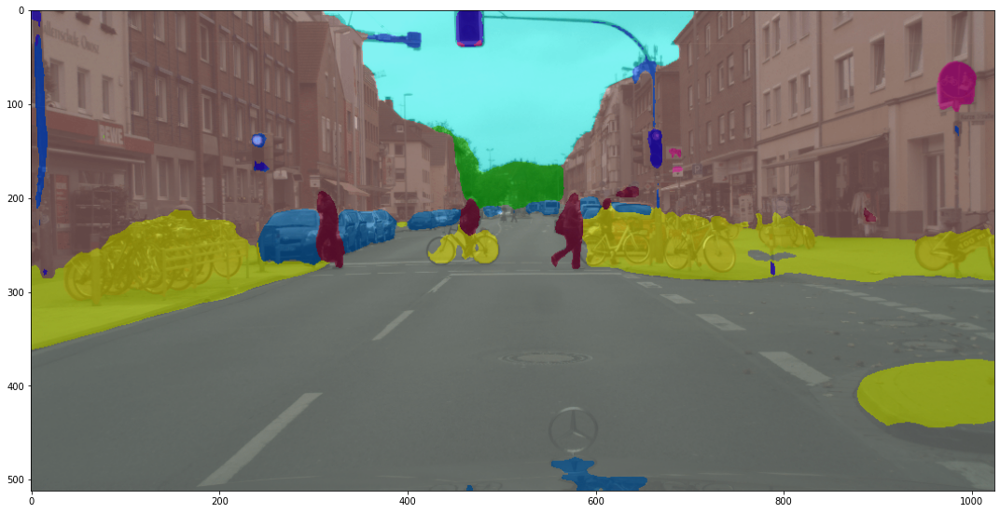

In [ ]:
# show the results
show_result_pyplot(model, img, result, get_palette('ade20k'))

## Train a semantic segmentation model on a new dataset

To train on a customized dataset, the following steps are necessary. 
1. Add a new dataset class. 
2. Create a config file accordingly. 
3. Perform training and evaluation. 

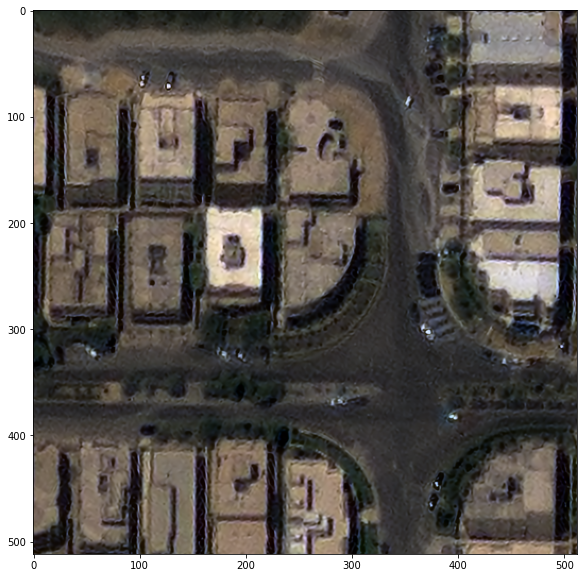

In [ ]:
# Let's take a look at the dataset
import mmcv
import matplotlib.pyplot as plt

img = mmcv.imread('/content/drive/Shareddrives/msmg/level1/upsampling/upsampled_car/train/building_crop16/image/BLD00001_PS3_K3A_NIA0276_x2_04.png')
plt.figure(figsize=(10, 10))
plt.imshow(mmcv.bgr2rgb(img))
plt.show()

In [ ]:
import os.path as osp
import numpy as np
from PIL import Image
import cv2

# convert dataset annotation to semantic segmentation map
data_root = '/content/drive/Shareddrives/msmg/level1/upsampling/upsampled_car/train/building_crop16'
img_dir = 'image'
ann_dir = 'annotation'

# define class and plaette for better visualization
classes = ('background', 'building')
palette = [[0, 0, 0], [0, 0, 255]]

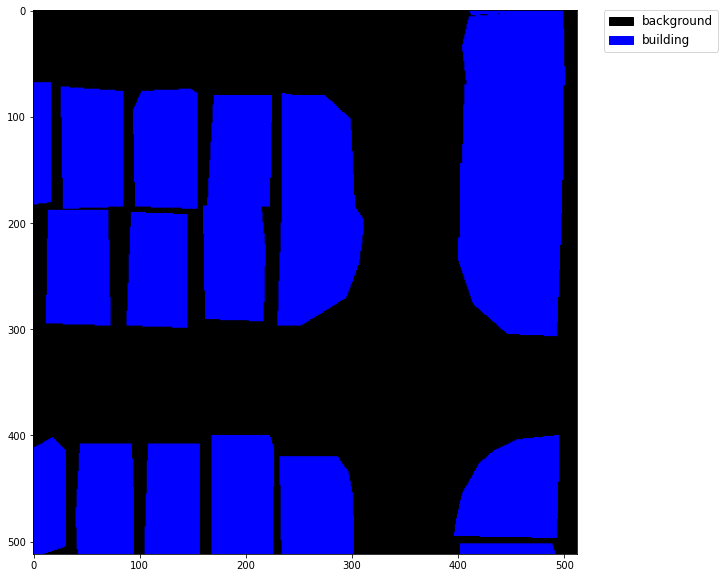

In [ ]:
# Let's take a look at the segmentation map we got
import matplotlib.patches as mpatches

img = Image.open('/content/drive/Shareddrives/msmg/level1/upsampling/upsampled_car/train/building_crop16/annotation/BLD00001_PS3_K3A_NIA0276_x2_04.png')
plt.figure(figsize=(10, 10))
im = plt.imshow(np.array(img.convert('RGB')))

# create a patch (proxy artist) for every color 
patches = [mpatches.Patch(color=np.array(palette[i])/255., label=classes[i]) for i in range(2)]

# put those patched as legend-handles into the legend
plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize='large')

plt.show()

# split train/val set randomly (최초 1회 유의)

In [ ]:
# convert dataset annotation to semantic segmentation map
data_root = '/content/drive/Shareddrives/msmg/level1/upsampling/upsampled_car/validation/building'
img_dir = 'image'
ann_dir = 'annotation'

# define class and plaette for better visualization
classes = ('background', 'building')
palette = [[0, 0, 0], [0, 0, 255]]

In [ ]:
# split train/val set randomly
split_dir = 'split'
mmcv.mkdir_or_exist(osp.join(data_root, split_dir))
filename_list = [osp.splitext(filename)[0] for filename in mmcv.scandir(osp.join(data_root + '/', ann_dir), suffix='.png')]

In [ ]:
with open(osp.join(data_root, split_dir, 'validation.txt'), 'w') as f:
    # select train set
    train_length = int(len(filename_list))
    f.writelines(line + '\n' for line in filename_list[:train_length])

#with open(osp.join(data_root, split_dir, 'val.txt'), 'w') as f:
#    # select last 1/5 as train set
#    f.writelines(line + '\n' for line in filename_list[train_length:])

# Create a config file
In the next step, we need to modify the config for the training. To accelerate the process, we finetune the model from trained weights.

In [ ]:
config_file = '/content/mmsegmentation/configs/hrnet/fcn_hr48_512x512_160k_ade20k.py'
checkpoint_file = '/content/mmsegmentation/checkpoints/fcn_hr48_512x512_160k_ade20k_20200614_214407-a52fc02c.pth'
save_pth_path = '/content/drive/Shareddrives/msmg/level1/upsampling/upsampled_car/hrnet/building/no1_building_upsample_iter15000_ce+lovasz_albu_checkpoint'

In [ ]:
# convert dataset annotation to semantic segmentation map
data_root = '/content/drive/Shareddrives/msmg/level1/upsampling/upsampled_car/train/building_crop16'
img_dir = 'image'
ann_dir = 'annotation'

# define class and plaette for better visualization
classes = ('background', 'building')
palette = [[0, 0, 0], [0, 0, 255]]

In [ ]:
from mmseg.datasets.builder import DATASETS
from mmseg.datasets.custom import CustomDataset

@DATASETS.register_module(force=True)
class BuildingSemanticSegmentation(CustomDataset):
    CLASSES = classes
    PALETTE = palette
    def __init__(self, split, **kwargs):
        super().__init__(img_suffix='.png', seg_map_suffix='.png', split=split, **kwargs)
        assert osp.exists(self.img_dir) and self.split is not None

In [ ]:
from mmcv import Config

cfg = Config.fromfile(config_file)

In [ ]:
from mmseg.apis import set_random_seed

# add CLASSES and PALETTE to checkpoint
cfg.checkpoint_config.meta = dict(
    CLASSES=classes,
    PALETTE=palette)

# Since we use only one GPU, BN is used instead of SyncBN
cfg.norm_cfg = dict(type='BN', requires_grad=True)
#cfg.model.backbone.norm_cfg = cfg.norm_cfg
cfg.model.decode_head.norm_cfg = cfg.norm_cfg
cfg.model.backbone.norm_cfg = cfg.norm_cfg

# modify num classes of the model in decode/auxiliary head
cfg.model.decode_head.num_classes = 2

# modify loss function crossentropy
cfg.model.decode_head.loss_decode= [
    dict(type='CrossEntropyLoss', class_weight=[0.5, 1.0], loss_name='loss_ce', loss_weight=0.8),
	dict(type='LovaszLoss', loss_type='multi_class', classes='all', per_image=True, reduction='mean', class_weight=[0.5, 1.0], loss_name='loss_lovasz', loss_weight=0.2)
]

# Modify dataset type and path
cfg.dataset_type = 'BuildingSemanticSegmentation'
cfg.data_root = data_root

cfg.data.samples_per_gpu = 8
cfg.data.workers_per_gpu = 8

# Albumentations transforms settings
albu_train_transforms = [
    dict(
    type='OneOf',
    transforms=[
        dict(type='RandomRotate90', p=1.0)
    ], p=0.5),

    dict(
    type='OneOf',
    transforms=[
        dict(type='RandomBrightnessContrast',brightness_limit=0.1, contrast_limit=0.15, p=1.0),
        dict(type='CLAHE', clip_limit=4.0, tile_grid_size=(8, 8), always_apply=False, p=1.0),
        dict(type='HueSaturationValue', hue_shift_limit=15, sat_shift_limit=25, val_shift_limit=10, p=1.0),
    ], p=0.5)
]

# pipline
cfg.img_norm_cfg = dict(
    mean=[123.675, 116.28, 103.53], std=[58.395, 57.12, 57.375], to_rgb=True)
cfg.crop_size = (512, 512)
cfg.train_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations'),
    dict(type='Resize', img_scale=(512, 512), ratio_range=(1.0, 1.2)),
    dict(type='RandomCrop', crop_size=cfg.crop_size),
    dict(type='RandomFlip', flip_ratio=0.5),
    dict(
        type='Albu',
        transforms=albu_train_transforms,
        keymap=dict(img='image', gt_semantic_seg='mask'),
        update_pad_shape=True,
        ),
    dict(type='PhotoMetricDistortion'),
    dict(type='Normalize', **cfg.img_norm_cfg),
    dict(type='Pad', size=cfg.crop_size, pad_val=0, seg_pad_val=255),
    dict(type='DefaultFormatBundle'),
    dict(type='Collect', keys=['img', 'gt_semantic_seg']),
]

cfg.test_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(
        type='MultiScaleFlipAug',
        img_scale=(512, 512),
        # img_ratios=[0.5, 0.75, 1.0, 1.25, 1.5, 1.75],
        flip=False,
        transforms=[
            dict(type='Resize', keep_ratio=True),
            dict(type='RandomFlip'),
            dict(type='Normalize', **cfg.img_norm_cfg),
            dict(type='ImageToTensor', keys=['img']),
            dict(type='Collect', keys=['img']),
        ])
]

cfg.data.train.type = cfg.dataset_type
cfg.data.train.data_root = '/content/drive/Shareddrives/msmg/level1/upsampling/upsampled_car/train/building_crop16/'
cfg.data.train.img_dir = 'image'
cfg.data.train.ann_dir = 'annotation'
cfg.data.train.pipeline = cfg.train_pipeline
cfg.data.train.split = 'split/train.txt'

cfg.data.val.type = cfg.dataset_type
cfg.data.val.data_root = '/content/drive/Shareddrives/msmg/level1/upsampling/upsampled_car/validation/building_crop16/'
cfg.data.val.img_dir = 'image'
cfg.data.val.ann_dir = 'annotation'
cfg.data.val.pipeline = cfg.test_pipeline
cfg.data.val.split = 'split/validation200.txt'

cfg.data.test.type = cfg.dataset_type
cfg.data.test.data_root = '/content/drive/Shareddrives/msmg/level1/dataset/validation/building/'
cfg.data.test.img_dir = 'image'
cfg.data.test.ann_dir = 'annotation'
cfg.data.test.pipeline = cfg.test_pipeline
cfg.data.test.split = 'split/validation.txt'

# We can still use the pre-trained Mask RCNN model though we do not need to
# use the mask branch
cfg.load_from = checkpoint_file

# Set up working dir to save files and logs.
cfg.work_dir = save_pth_path

cfg.runner.max_iters = 15000
cfg.log_config.interval = 10
cfg.evaluation.interval = 100
cfg.evaluation.save_best = 'mIoU'
cfg.checkpoint_config.interval = 2000

# Set seed to facitate reproducing the result
cfg.seed = 0
set_random_seed(0, deterministic=False)
cfg.gpu_ids = range(1)

# We can also use tensorboard to log the training process
cfg.log_config.hooks = [
    dict(type='TextLoggerHook'),
    dict(type='TensorboardLoggerHook')]

# Let's have a look at the final config used for training
print(f'Config:\n{cfg.pretty_text}')

Config:
norm_cfg = dict(type='BN', requires_grad=True)
model = dict(
    type='EncoderDecoder',
    pretrained='open-mmlab://msra/hrnetv2_w48',
    backbone=dict(
        type='HRNet',
        norm_cfg=dict(type='BN', requires_grad=True),
        norm_eval=False,
        extra=dict(
            stage1=dict(
                num_modules=1,
                num_branches=1,
                block='BOTTLENECK',
                num_blocks=(4, ),
                num_channels=(64, )),
            stage2=dict(
                num_modules=1,
                num_branches=2,
                block='BASIC',
                num_blocks=(4, 4),
                num_channels=(48, 96)),
            stage3=dict(
                num_modules=4,
                num_branches=3,
                block='BASIC',
                num_blocks=(4, 4, 4),
                num_channels=(48, 96, 192)),
            stage4=dict(
                num_modules=3,
                num_branches=4,
                block='BASIC',
     

# Train and Evaluation

In [ ]:
from mmseg.datasets import build_dataset
from mmseg.models import build_segmentor
from mmseg.apis import train_segmentor

# Build the dataset
datasets = [build_dataset(cfg.data.train)]

2022-06-01 02:18:28,297 - mmseg - INFO - Loaded 19808 images


In [ ]:
# Build the detector
model = build_segmentor(
    cfg.model, train_cfg=cfg.get('train_cfg'), test_cfg=cfg.get('test_cfg'))

# Add an attribute for visualization convenience
model.CLASSES = datasets[0].CLASSES

/content/mmsegmentation/mmseg/models/backbones/hrnet.py:318: UserWarning: DeprecationWarning: pretrained is deprecated, please use "init_cfg" instead
  warnings.warn('DeprecationWarning: pretrained is deprecated, '
/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


In [ ]:
# Create work_dir
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))
train_segmentor(model, datasets, cfg, distributed=False, validate=True, meta=dict())

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:490: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
2022-06-01 02:18:33,520 - mmseg - INFO - Loaded 200 images
2022-06-01 02:18:33,525 - mmseg - INFO - load checkpoint from local path: /content/mmsegmentation/checkpoints/fcn_hr48_512x512_160k_ade20k_20200614_214407-a52fc02c.pth
2022-06-01 02:18:34,195 - mmseg - WARNING - The model and loaded state dict do not match exactly

size mismatch for decode_head.conv_seg.weight: copying a param with shape torch.Size([150, 720, 1, 1]) from checkpoint, the shape in current model is torch.Size([2, 720, 1, 1]).
size mismatch for decode_head.conv_seg.bi

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 1.0 task/s, elapsed: 210s, ETA:     0s

2022-06-01 02:25:01,643 - mmseg - INFO - per class results:
2022-06-01 02:25:01,647 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 79.49 | 82.75 |
|  building  | 59.34 | 88.36 |
+------------+-------+-------+
2022-06-01 02:25:01,652 - mmseg - INFO - Summary:
2022-06-01 02:25:01,657 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 84.21 | 69.41 | 85.55 |
+-------+-------+-------+
2022-06-01 02:25:06,404 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_100.pth.
2022-06-01 02:25:06,406 - mmseg - INFO - Best mIoU is 0.6941 at 100 iter.
2022-06-01 02:25:06,412 - mmseg - INFO - Iter(val) [200]	aAcc: 0.8421, mIoU: 0.6941, mAcc: 0.8555, IoU.background: 0.7949, IoU.building: 0.5934, Acc.background: 0.8275, Acc.building: 0.8836
2022-06-01 02:25:22,787 - mmseg - INFO - Iter [110/15000]	lr: 9.935e-03, eta: 15:14:28, time: 23.080, data_time: 21.454, memory: 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 02:29:04,410 - mmseg - INFO - per class results:
2022-06-01 02:29:04,419 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 83.99 | 88.41 |
|  building  | 64.04 | 85.07 |
+------------+-------+-------+
2022-06-01 02:29:04,426 - mmseg - INFO - Summary:
2022-06-01 02:29:04,428 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 87.54 | 74.01 | 86.74 |
+-------+-------+-------+
2022-06-01 02:29:04,539 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/level1/upsampling/upsampled_car/hrnet/building/no1_building_upsample_iter15000_ce+lovasz_albu_checkpoint/best_mIoU_iter_100.pth was removed
2022-06-01 02:29:09,520 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_200.pth.
2022-06-01 02:29:09,524 - mmseg - INFO - Best mIoU is 0.7401 at 200 iter.
2022-06-01 02:29:09,531 - mmseg - INFO - Iter(val) [200]	aAcc: 0.8754, mIoU:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 02:33:08,082 - mmseg - INFO - per class results:
2022-06-01 02:33:08,085 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 87.08 | 91.73 |
|  building  | 68.75 | 84.88 |
+------------+-------+-------+
2022-06-01 02:33:08,089 - mmseg - INFO - Summary:
2022-06-01 02:33:08,093 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 89.94 | 77.92 | 88.3 |
+-------+-------+------+
2022-06-01 02:33:08,114 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/level1/upsampling/upsampled_car/hrnet/building/no1_building_upsample_iter15000_ce+lovasz_albu_checkpoint/best_mIoU_iter_200.pth was removed
2022-06-01 02:33:11,980 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_300.pth.
2022-06-01 02:33:11,983 - mmseg - INFO - Best mIoU is 0.7792 at 300 iter.
2022-06-01 02:33:11,988 - mmseg - INFO - Iter(val) [200]	aAcc: 0.8994, mIoU: 0.77

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 02:37:10,299 - mmseg - INFO - per class results:
2022-06-01 02:37:10,303 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 86.65 |  91.0 |
|  building  | 68.34 | 85.78 |
+------------+-------+-------+
2022-06-01 02:37:10,307 - mmseg - INFO - Summary:
2022-06-01 02:37:10,309 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 89.64 | 77.49 | 88.39 |
+-------+-------+-------+
2022-06-01 02:37:10,311 - mmseg - INFO - Iter(val) [200]	aAcc: 0.8964, mIoU: 0.7749, mAcc: 0.8839, IoU.background: 0.8665, IoU.building: 0.6834, Acc.background: 0.9100, Acc.building: 0.8578
2022-06-01 02:37:26,141 - mmseg - INFO - Iter [410/15000]	lr: 9.757e-03, eta: 11:09:24, time: 9.545, data_time: 7.976, memory: 11144, decode.loss_ce: 0.0997, decode.loss_lovasz: 0.0397, decode.acc_seg: 92.5742, loss: 0.1394
2022-06-01 02:37:42,118 - mmseg - INFO - Iter [420/15000]	lr: 9.751e-03, eta

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 02:41:07,716 - mmseg - INFO - per class results:
2022-06-01 02:41:07,720 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 88.49 |  93.2 |
|  building  | 71.19 | 84.91 |
+------------+-------+-------+
2022-06-01 02:41:07,727 - mmseg - INFO - Summary:
2022-06-01 02:41:07,732 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 91.04 | 79.84 | 89.05 |
+-------+-------+-------+
2022-06-01 02:41:07,793 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/level1/upsampling/upsampled_car/hrnet/building/no1_building_upsample_iter15000_ce+lovasz_albu_checkpoint/best_mIoU_iter_300.pth was removed
2022-06-01 02:41:12,090 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_500.pth.
2022-06-01 02:41:12,092 - mmseg - INFO - Best mIoU is 0.7984 at 500 iter.
2022-06-01 02:41:12,101 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9104, mIoU:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 02:45:11,082 - mmseg - INFO - per class results:
2022-06-01 02:45:11,085 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 86.11 | 89.63 |
|  building  | 68.34 | 88.43 |
+------------+-------+-------+
2022-06-01 02:45:11,088 - mmseg - INFO - Summary:
2022-06-01 02:45:11,093 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 89.32 | 77.23 | 89.03 |
+-------+-------+-------+
2022-06-01 02:45:11,098 - mmseg - INFO - Iter(val) [200]	aAcc: 0.8932, mIoU: 0.7723, mAcc: 0.8903, IoU.background: 0.8611, IoU.building: 0.6834, Acc.background: 0.8963, Acc.building: 0.8843
2022-06-01 02:45:26,879 - mmseg - INFO - Iter [610/15000]	lr: 9.638e-03, eta: 10:32:46, time: 9.574, data_time: 8.011, memory: 11144, decode.loss_ce: 0.1151, decode.loss_lovasz: 0.0438, decode.acc_seg: 91.2421, loss: 0.1589
2022-06-01 02:45:42,688 - mmseg - INFO - Iter [620/15000]	lr: 9.632e-03, eta

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 02:49:08,129 - mmseg - INFO - per class results:
2022-06-01 02:49:08,131 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 87.72 | 92.49 |
|  building  | 69.75 |  84.6 |
+------------+-------+-------+
2022-06-01 02:49:08,135 - mmseg - INFO - Summary:
2022-06-01 02:49:08,137 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 90.43 | 78.74 | 88.55 |
+-------+-------+-------+
2022-06-01 02:49:08,142 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9043, mIoU: 0.7874, mAcc: 0.8855, IoU.background: 0.8772, IoU.building: 0.6975, Acc.background: 0.9249, Acc.building: 0.8460
2022-06-01 02:49:23,843 - mmseg - INFO - Iter [710/15000]	lr: 9.578e-03, eta: 10:19:21, time: 9.456, data_time: 7.901, memory: 11144, decode.loss_ce: 0.1080, decode.loss_lovasz: 0.0426, decode.acc_seg: 91.3532, loss: 0.1505
2022-06-01 02:49:39,703 - mmseg - INFO - Iter [720/15000]	lr: 9.572e-03, eta

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 02:53:05,869 - mmseg - INFO - per class results:
2022-06-01 02:53:05,871 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 86.35 | 89.51 |
|  building  |  69.1 | 89.65 |
+------------+-------+-------+
2022-06-01 02:53:05,874 - mmseg - INFO - Summary:
2022-06-01 02:53:05,879 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 89.54 | 77.72 | 89.58 |
+-------+-------+-------+
2022-06-01 02:53:05,883 - mmseg - INFO - Iter(val) [200]	aAcc: 0.8954, mIoU: 0.7772, mAcc: 0.8958, IoU.background: 0.8635, IoU.building: 0.6910, Acc.background: 0.8951, Acc.building: 0.8965
2022-06-01 02:53:21,627 - mmseg - INFO - Iter [810/15000]	lr: 9.518e-03, eta: 10:08:31, time: 9.476, data_time: 7.916, memory: 11144, decode.loss_ce: 0.1109, decode.loss_lovasz: 0.0429, decode.acc_seg: 90.9309, loss: 0.1538
2022-06-01 02:53:37,392 - mmseg - INFO - Iter [820/15000]	lr: 9.512e-03, eta

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 02:57:03,919 - mmseg - INFO - per class results:
2022-06-01 02:57:03,922 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 87.08 | 91.54 |
|  building  | 68.95 | 85.48 |
+------------+-------+-------+
2022-06-01 02:57:03,924 - mmseg - INFO - Summary:
2022-06-01 02:57:03,933 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 89.96 | 78.01 | 88.51 |
+-------+-------+-------+
2022-06-01 02:57:03,936 - mmseg - INFO - Iter(val) [200]	aAcc: 0.8996, mIoU: 0.7801, mAcc: 0.8851, IoU.background: 0.8708, IoU.building: 0.6895, Acc.background: 0.9154, Acc.building: 0.8548
2022-06-01 02:57:19,826 - mmseg - INFO - Iter [910/15000]	lr: 9.458e-03, eta: 9:59:18, time: 9.539, data_time: 7.967, memory: 11144, decode.loss_ce: 0.1142, decode.loss_lovasz: 0.0478, decode.acc_seg: 91.3966, loss: 0.1621
2022-06-01 02:57:35,739 - mmseg - INFO - Iter [920/15000]	lr: 9.452e-03, eta:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 03:01:01,793 - mmseg - INFO - per class results:
2022-06-01 03:01:01,796 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 82.16 |  84.3 |
|  building  |  64.1 | 92.62 |
+------------+-------+-------+
2022-06-01 03:01:01,800 - mmseg - INFO - Summary:
2022-06-01 03:01:01,806 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 86.47 | 73.13 | 88.46 |
+-------+-------+-------+
2022-06-01 03:01:01,810 - mmseg - INFO - Iter(val) [200]	aAcc: 0.8647, mIoU: 0.7313, mAcc: 0.8846, IoU.background: 0.8216, IoU.building: 0.6410, Acc.background: 0.8430, Acc.building: 0.9262
2022-06-01 03:01:17,595 - mmseg - INFO - Iter [1010/15000]	lr: 9.399e-03, eta: 9:51:01, time: 9.492, data_time: 7.929, memory: 11144, decode.loss_ce: 0.1214, decode.loss_lovasz: 0.0460, decode.acc_seg: 90.0694, loss: 0.1673
2022-06-01 03:01:33,474 - mmseg - INFO - Iter [1020/15000]	lr: 9.393e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 03:05:00,572 - mmseg - INFO - per class results:
2022-06-01 03:05:00,576 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 82.23 | 84.91 |
|  building  | 63.57 | 90.76 |
+------------+-------+-------+
2022-06-01 03:05:00,582 - mmseg - INFO - Summary:
2022-06-01 03:05:00,591 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 86.44 | 72.9 | 87.84 |
+-------+------+-------+
2022-06-01 03:05:00,595 - mmseg - INFO - Iter(val) [200]	aAcc: 0.8644, mIoU: 0.7290, mAcc: 0.8784, IoU.background: 0.8223, IoU.building: 0.6357, Acc.background: 0.8491, Acc.building: 0.9076
2022-06-01 03:05:16,393 - mmseg - INFO - Iter [1110/15000]	lr: 9.339e-03, eta: 9:43:44, time: 9.543, data_time: 7.979, memory: 11144, decode.loss_ce: 0.0999, decode.loss_lovasz: 0.0401, decode.acc_seg: 92.3991, loss: 0.1400
2022-06-01 03:05:32,234 - mmseg - INFO - Iter [1120/15000]	lr: 9.333e-03, eta: 9:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 03:08:58,844 - mmseg - INFO - per class results:
2022-06-01 03:08:58,847 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 86.15 | 90.25 |
|  building  | 67.76 | 86.49 |
+------------+-------+-------+
2022-06-01 03:08:58,849 - mmseg - INFO - Summary:
2022-06-01 03:08:58,855 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 89.27 | 76.95 | 88.37 |
+-------+-------+-------+
2022-06-01 03:08:58,860 - mmseg - INFO - Iter(val) [200]	aAcc: 0.8927, mIoU: 0.7695, mAcc: 0.8837, IoU.background: 0.8615, IoU.building: 0.6776, Acc.background: 0.9025, Acc.building: 0.8649
2022-06-01 03:09:14,689 - mmseg - INFO - Iter [1210/15000]	lr: 9.279e-03, eta: 9:36:54, time: 9.528, data_time: 7.960, memory: 11144, decode.loss_ce: 0.0907, decode.loss_lovasz: 0.0445, decode.acc_seg: 91.9148, loss: 0.1352
2022-06-01 03:09:30,556 - mmseg - INFO - Iter [1220/15000]	lr: 9.273e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 03:12:57,067 - mmseg - INFO - per class results:
2022-06-01 03:12:57,070 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 87.07 | 90.52 |
|  building  | 69.97 | 88.79 |
+------------+-------+-------+
2022-06-01 03:12:57,074 - mmseg - INFO - Summary:
2022-06-01 03:12:57,077 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 90.07 | 78.52 | 89.65 |
+-------+-------+-------+
2022-06-01 03:12:57,082 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9007, mIoU: 0.7852, mAcc: 0.8965, IoU.background: 0.8707, IoU.building: 0.6997, Acc.background: 0.9052, Acc.building: 0.8879
2022-06-01 03:13:12,865 - mmseg - INFO - Iter [1310/15000]	lr: 9.219e-03, eta: 9:30:29, time: 9.547, data_time: 7.983, memory: 11144, decode.loss_ce: 0.1231, decode.loss_lovasz: 0.0439, decode.acc_seg: 91.4794, loss: 0.1670
2022-06-01 03:13:28,662 - mmseg - INFO - Iter [1320/15000]	lr: 9.213e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 03:16:54,580 - mmseg - INFO - per class results:
2022-06-01 03:16:54,583 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 87.44 | 90.42 |
|  building  | 71.04 | 90.33 |
+------------+-------+-------+
2022-06-01 03:16:54,586 - mmseg - INFO - Summary:
2022-06-01 03:16:54,591 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 90.4 | 79.24 | 90.38 |
+------+-------+-------+
2022-06-01 03:16:54,595 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9040, mIoU: 0.7924, mAcc: 0.9038, IoU.background: 0.8744, IoU.building: 0.7104, Acc.background: 0.9042, Acc.building: 0.9033
2022-06-01 03:17:10,652 - mmseg - INFO - Iter [1410/15000]	lr: 9.159e-03, eta: 9:24:21, time: 9.532, data_time: 7.947, memory: 11144, decode.loss_ce: 0.1264, decode.loss_lovasz: 0.0481, decode.acc_seg: 89.5390, loss: 0.1745
2022-06-01 03:17:26,579 - mmseg - INFO - Iter [1420/15000]	lr: 9.153e-03, eta: 9:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 03:20:52,952 - mmseg - INFO - per class results:
2022-06-01 03:20:52,956 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 86.92 | 89.47 |
|  building  |  70.6 | 91.68 |
+------------+-------+-------+
2022-06-01 03:20:52,959 - mmseg - INFO - Summary:
2022-06-01 03:20:52,969 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 90.05 | 78.76 | 90.57 |
+-------+-------+-------+
2022-06-01 03:20:52,972 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9005, mIoU: 0.7876, mAcc: 0.9057, IoU.background: 0.8692, IoU.building: 0.7060, Acc.background: 0.8947, Acc.building: 0.9168
2022-06-01 03:21:08,876 - mmseg - INFO - Iter [1510/15000]	lr: 9.099e-03, eta: 9:18:34, time: 9.509, data_time: 7.937, memory: 11144, decode.loss_ce: 0.0823, decode.loss_lovasz: 0.0356, decode.acc_seg: 93.2344, loss: 0.1179
2022-06-01 03:21:24,807 - mmseg - INFO - Iter [1520/15000]	lr: 9.093e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 03:24:51,026 - mmseg - INFO - per class results:
2022-06-01 03:24:51,028 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 88.49 | 91.58 |
|  building  | 72.73 |  90.1 |
+------------+-------+-------+
2022-06-01 03:24:51,032 - mmseg - INFO - Summary:
2022-06-01 03:24:51,037 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 91.19 | 80.61 | 90.84 |
+-------+-------+-------+
2022-06-01 03:24:51,051 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/level1/upsampling/upsampled_car/hrnet/building/no1_building_upsample_iter15000_ce+lovasz_albu_checkpoint/best_mIoU_iter_500.pth was removed
2022-06-01 03:24:55,489 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_1600.pth.
2022-06-01 03:24:55,492 - mmseg - INFO - Best mIoU is 0.8061 at 1600 iter.
2022-06-01 03:24:55,498 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9119, mIo

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.6 task/s, elapsed: 78s, ETA:     0s

2022-06-01 03:28:52,187 - mmseg - INFO - per class results:
2022-06-01 03:28:52,189 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 84.39 | 89.48 |
|  building  | 63.86 |  82.9 |
+------------+-------+-------+
2022-06-01 03:28:52,197 - mmseg - INFO - Summary:
2022-06-01 03:28:52,198 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 87.77 | 74.13 | 86.19 |
+-------+-------+-------+
2022-06-01 03:28:52,205 - mmseg - INFO - Iter(val) [200]	aAcc: 0.8777, mIoU: 0.7413, mAcc: 0.8619, IoU.background: 0.8439, IoU.building: 0.6386, Acc.background: 0.8948, Acc.building: 0.8290
2022-06-01 03:29:08,067 - mmseg - INFO - Iter [1710/15000]	lr: 8.979e-03, eta: 9:07:59, time: 9.417, data_time: 7.846, memory: 11144, decode.loss_ce: 0.1405, decode.loss_lovasz: 0.0499, decode.acc_seg: 89.7600, loss: 0.1904
2022-06-01 03:29:23,989 - mmseg - INFO - Iter [1720/15000]	lr: 8.973e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 03:32:49,716 - mmseg - INFO - per class results:
2022-06-01 03:32:49,724 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 86.63 | 89.47 |
|  building  | 69.85 |  90.7 |
+------------+-------+-------+
2022-06-01 03:32:49,725 - mmseg - INFO - Summary:
2022-06-01 03:32:49,728 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 89.79 | 78.24 | 90.09 |
+-------+-------+-------+
2022-06-01 03:32:49,730 - mmseg - INFO - Iter(val) [200]	aAcc: 0.8979, mIoU: 0.7824, mAcc: 0.9009, IoU.background: 0.8663, IoU.building: 0.6985, Acc.background: 0.8947, Acc.building: 0.9070
2022-06-01 03:33:05,452 - mmseg - INFO - Iter [1810/15000]	lr: 8.919e-03, eta: 9:02:39, time: 9.446, data_time: 7.889, memory: 11144, decode.loss_ce: 0.1076, decode.loss_lovasz: 0.0423, decode.acc_seg: 91.3199, loss: 0.1500
2022-06-01 03:33:21,353 - mmseg - INFO - Iter [1820/15000]	lr: 8.913e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 03:36:48,019 - mmseg - INFO - per class results:
2022-06-01 03:36:48,024 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.02 | 94.79 |
|  building  | 74.05 | 84.99 |
+------------+-------+-------+
2022-06-01 03:36:48,026 - mmseg - INFO - Summary:
2022-06-01 03:36:48,031 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.23 | 82.04 | 89.89 |
+-------+-------+-------+
2022-06-01 03:36:48,045 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/level1/upsampling/upsampled_car/hrnet/building/no1_building_upsample_iter15000_ce+lovasz_albu_checkpoint/best_mIoU_iter_1600.pth was removed
2022-06-01 03:36:52,433 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_1900.pth.
2022-06-01 03:36:52,439 - mmseg - INFO - Best mIoU is 0.8204 at 1900 iter.
2022-06-01 03:36:52,442 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9223, mI

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 03:40:56,240 - mmseg - INFO - per class results:
2022-06-01 03:40:56,243 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 82.97 | 85.05 |
|  building  | 65.23 | 92.88 |
+------------+-------+-------+
2022-06-01 03:40:56,251 - mmseg - INFO - Summary:
2022-06-01 03:40:56,254 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 87.09 | 74.1 | 88.96 |
+-------+------+-------+
2022-06-01 03:40:56,258 - mmseg - INFO - Iter(val) [200]	aAcc: 0.8709, mIoU: 0.7410, mAcc: 0.8896, IoU.background: 0.8297, IoU.building: 0.6523, Acc.background: 0.8505, Acc.building: 0.9288
2022-06-01 03:41:12,092 - mmseg - INFO - Iter [2010/15000]	lr: 8.798e-03, eta: 8:53:40, time: 9.594, data_time: 8.027, memory: 11144, decode.loss_ce: 0.1362, decode.loss_lovasz: 0.0474, decode.acc_seg: 89.2220, loss: 0.1836
2022-06-01 03:41:27,941 - mmseg - INFO - Iter [2020/15000]	lr: 8.792e-03, eta: 8:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 03:44:55,233 - mmseg - INFO - per class results:
2022-06-01 03:44:55,236 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 89.61 | 92.52 |
|  building  | 74.91 | 90.79 |
+------------+-------+-------+
2022-06-01 03:44:55,241 - mmseg - INFO - Summary:
2022-06-01 03:44:55,245 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.07 | 82.26 | 91.66 |
+-------+-------+-------+
2022-06-01 03:44:55,260 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/level1/upsampling/upsampled_car/hrnet/building/no1_building_upsample_iter15000_ce+lovasz_albu_checkpoint/best_mIoU_iter_1900.pth was removed
2022-06-01 03:44:59,909 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_2100.pth.
2022-06-01 03:44:59,912 - mmseg - INFO - Best mIoU is 0.8226 at 2100 iter.
2022-06-01 03:44:59,924 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9207, mI

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 03:48:58,815 - mmseg - INFO - per class results:
2022-06-01 03:48:58,821 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 89.27 | 93.45 |
|  building  | 73.14 | 86.73 |
+------------+-------+-------+
2022-06-01 03:48:58,825 - mmseg - INFO - Summary:
2022-06-01 03:48:58,827 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 91.69 | 81.2 | 90.09 |
+-------+------+-------+
2022-06-01 03:48:58,833 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9169, mIoU: 0.8120, mAcc: 0.9009, IoU.background: 0.8927, IoU.building: 0.7314, Acc.background: 0.9345, Acc.building: 0.8673
2022-06-01 03:49:14,636 - mmseg - INFO - Iter [2210/15000]	lr: 8.678e-03, eta: 8:44:26, time: 9.567, data_time: 8.003, memory: 11144, decode.loss_ce: 0.0819, decode.loss_lovasz: 0.0372, decode.acc_seg: 94.1730, loss: 0.1192
2022-06-01 03:49:30,499 - mmseg - INFO - Iter [2220/15000]	lr: 8.672e-03, eta: 8:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 03:52:58,101 - mmseg - INFO - per class results:
2022-06-01 03:52:58,105 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 88.08 | 90.37 |
|  building  | 72.75 | 92.61 |
+------------+-------+-------+
2022-06-01 03:52:58,109 - mmseg - INFO - Summary:
2022-06-01 03:52:58,111 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 90.96 | 80.42 | 91.49 |
+-------+-------+-------+
2022-06-01 03:52:58,116 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9096, mIoU: 0.8042, mAcc: 0.9149, IoU.background: 0.8808, IoU.building: 0.7275, Acc.background: 0.9037, Acc.building: 0.9261
2022-06-01 03:53:14,218 - mmseg - INFO - Iter [2310/15000]	lr: 8.617e-03, eta: 8:39:45, time: 9.550, data_time: 7.962, memory: 11144, decode.loss_ce: 0.1033, decode.loss_lovasz: 0.0384, decode.acc_seg: 92.4900, loss: 0.1417
2022-06-01 03:53:30,362 - mmseg - INFO - Iter [2320/15000]	lr: 8.611e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 03:56:56,997 - mmseg - INFO - per class results:
2022-06-01 03:56:56,999 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 87.66 | 92.12 |
|  building  | 69.94 | 85.56 |
+------------+-------+-------+
2022-06-01 03:56:57,004 - mmseg - INFO - Summary:
2022-06-01 03:56:57,009 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 90.41 | 78.8 | 88.84 |
+-------+------+-------+
2022-06-01 03:56:57,012 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9041, mIoU: 0.7880, mAcc: 0.8884, IoU.background: 0.8766, IoU.building: 0.6994, Acc.background: 0.9212, Acc.building: 0.8556
2022-06-01 03:57:12,859 - mmseg - INFO - Iter [2410/15000]	lr: 8.557e-03, eta: 8:35:02, time: 9.534, data_time: 7.965, memory: 11144, decode.loss_ce: 0.0834, decode.loss_lovasz: 0.0366, decode.acc_seg: 93.5087, loss: 0.1200
2022-06-01 03:57:28,717 - mmseg - INFO - Iter [2420/15000]	lr: 8.551e-03, eta: 8:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 04:00:59,579 - mmseg - INFO - per class results:
2022-06-01 04:00:59,583 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 89.29 | 92.81 |
|  building  | 73.78 | 88.81 |
+------------+-------+-------+
2022-06-01 04:00:59,585 - mmseg - INFO - Summary:
2022-06-01 04:00:59,592 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 91.77 | 81.54 | 90.81 |
+-------+-------+-------+
2022-06-01 04:00:59,596 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9177, mIoU: 0.8154, mAcc: 0.9081, IoU.background: 0.8929, IoU.building: 0.7378, Acc.background: 0.9281, Acc.building: 0.8881
2022-06-01 04:01:15,301 - mmseg - INFO - Iter [2510/15000]	lr: 8.496e-03, eta: 8:30:41, time: 9.494, data_time: 7.938, memory: 11144, decode.loss_ce: 0.0879, decode.loss_lovasz: 0.0354, decode.acc_seg: 93.1950, loss: 0.1233
2022-06-01 04:01:31,017 - mmseg - INFO - Iter [2520/15000]	lr: 8.490e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 04:04:56,293 - mmseg - INFO - per class results:
2022-06-01 04:04:56,297 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 89.23 | 92.04 |
|  building  | 74.29 | 91.06 |
+------------+-------+-------+
2022-06-01 04:04:56,299 - mmseg - INFO - Summary:
2022-06-01 04:04:56,307 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 91.78 | 81.76 | 91.55 |
+-------+-------+-------+
2022-06-01 04:04:56,310 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9178, mIoU: 0.8176, mAcc: 0.9155, IoU.background: 0.8923, IoU.building: 0.7429, Acc.background: 0.9204, Acc.building: 0.9106
2022-06-01 04:05:12,078 - mmseg - INFO - Iter [2610/15000]	lr: 8.436e-03, eta: 8:25:55, time: 9.509, data_time: 7.948, memory: 11144, decode.loss_ce: 0.0866, decode.loss_lovasz: 0.0365, decode.acc_seg: 93.4175, loss: 0.1231
2022-06-01 04:05:27,805 - mmseg - INFO - Iter [2620/15000]	lr: 8.430e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 04:08:53,074 - mmseg - INFO - per class results:
2022-06-01 04:08:53,077 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 88.25 | 92.07 |
|  building  | 71.62 | 87.72 |
+------------+-------+-------+
2022-06-01 04:08:53,087 - mmseg - INFO - Summary:
2022-06-01 04:08:53,091 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 90.94 | 79.94 | 89.9 |
+-------+-------+------+
2022-06-01 04:08:53,093 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9094, mIoU: 0.7994, mAcc: 0.8990, IoU.background: 0.8825, IoU.building: 0.7162, Acc.background: 0.9207, Acc.building: 0.8772
2022-06-01 04:09:08,784 - mmseg - INFO - Iter [2710/15000]	lr: 8.375e-03, eta: 8:21:13, time: 9.485, data_time: 7.930, memory: 11144, decode.loss_ce: 0.1092, decode.loss_lovasz: 0.0467, decode.acc_seg: 92.1044, loss: 0.1559
2022-06-01 04:09:24,499 - mmseg - INFO - Iter [2720/15000]	lr: 8.369e-03, eta: 8:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 04:12:50,144 - mmseg - INFO - per class results:
2022-06-01 04:12:50,148 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 87.08 | 89.13 |
|  building  | 71.34 | 93.31 |
+------------+-------+-------+
2022-06-01 04:12:50,154 - mmseg - INFO - Summary:
2022-06-01 04:12:50,159 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 90.22 | 79.21 | 91.22 |
+-------+-------+-------+
2022-06-01 04:12:50,161 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9022, mIoU: 0.7921, mAcc: 0.9122, IoU.background: 0.8708, IoU.building: 0.7134, Acc.background: 0.8913, Acc.building: 0.9331
2022-06-01 04:13:05,920 - mmseg - INFO - Iter [2810/15000]	lr: 8.315e-03, eta: 8:16:35, time: 9.563, data_time: 8.003, memory: 11144, decode.loss_ce: 0.1128, decode.loss_lovasz: 0.0408, decode.acc_seg: 91.6413, loss: 0.1536
2022-06-01 04:13:21,652 - mmseg - INFO - Iter [2820/15000]	lr: 8.309e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 04:16:48,058 - mmseg - INFO - per class results:
2022-06-01 04:16:48,063 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.19 | 95.68 |
|  building  | 76.65 | 86.03 |
+------------+-------+-------+
2022-06-01 04:16:48,065 - mmseg - INFO - Summary:
2022-06-01 04:16:48,068 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.16 | 83.92 | 90.86 |
+-------+-------+-------+
2022-06-01 04:16:48,088 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/level1/upsampling/upsampled_car/hrnet/building/no1_building_upsample_iter15000_ce+lovasz_albu_checkpoint/best_mIoU_iter_2100.pth was removed
2022-06-01 04:16:52,772 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_2900.pth.
2022-06-01 04:16:52,775 - mmseg - INFO - Best mIoU is 0.8392 at 2900 iter.
2022-06-01 04:16:52,781 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9316, mI

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 04:20:50,177 - mmseg - INFO - per class results:
2022-06-01 04:20:50,181 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 89.95 | 93.01 |
|  building  | 75.42 | 90.37 |
+------------+-------+-------+
2022-06-01 04:20:50,182 - mmseg - INFO - Summary:
2022-06-01 04:20:50,185 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.32 | 82.68 | 91.69 |
+-------+-------+-------+
2022-06-01 04:20:50,192 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9232, mIoU: 0.8268, mAcc: 0.9169, IoU.background: 0.8995, IoU.building: 0.7542, Acc.background: 0.9301, Acc.building: 0.9037
2022-06-01 04:21:05,927 - mmseg - INFO - Iter [3010/15000]	lr: 8.193e-03, eta: 8:07:51, time: 9.560, data_time: 8.001, memory: 11144, decode.loss_ce: 0.0816, decode.loss_lovasz: 0.0361, decode.acc_seg: 93.7368, loss: 0.1177
2022-06-01 04:21:21,667 - mmseg - INFO - Iter [3020/15000]	lr: 8.187e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 04:24:46,933 - mmseg - INFO - per class results:
2022-06-01 04:24:46,937 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  90.7 | 93.89 |
|  building  | 76.74 | 90.03 |
+------------+-------+-------+
2022-06-01 04:24:46,939 - mmseg - INFO - Summary:
2022-06-01 04:24:46,944 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.88 | 83.72 | 91.96 |
+-------+-------+-------+
2022-06-01 04:24:46,949 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9288, mIoU: 0.8372, mAcc: 0.9196, IoU.background: 0.9070, IoU.building: 0.7674, Acc.background: 0.9389, Acc.building: 0.9003
2022-06-01 04:25:02,662 - mmseg - INFO - Iter [3110/15000]	lr: 8.132e-03, eta: 8:03:19, time: 9.514, data_time: 7.957, memory: 11144, decode.loss_ce: 0.0794, decode.loss_lovasz: 0.0324, decode.acc_seg: 93.5477, loss: 0.1118
2022-06-01 04:25:18,352 - mmseg - INFO - Iter [3120/15000]	lr: 8.126e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 04:28:44,722 - mmseg - INFO - per class results:
2022-06-01 04:28:44,724 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  84.4 | 85.87 |
|  building  | 67.87 | 95.05 |
+------------+-------+-------+
2022-06-01 04:28:44,726 - mmseg - INFO - Summary:
2022-06-01 04:28:44,732 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 88.27 | 76.14 | 90.46 |
+-------+-------+-------+
2022-06-01 04:28:44,735 - mmseg - INFO - Iter(val) [200]	aAcc: 0.8827, mIoU: 0.7614, mAcc: 0.9046, IoU.background: 0.8440, IoU.building: 0.6787, Acc.background: 0.8587, Acc.building: 0.9505
2022-06-01 04:29:00,450 - mmseg - INFO - Iter [3210/15000]	lr: 8.072e-03, eta: 7:58:52, time: 9.496, data_time: 7.939, memory: 11144, decode.loss_ce: 0.0816, decode.loss_lovasz: 0.0382, decode.acc_seg: 93.2526, loss: 0.1198
2022-06-01 04:29:16,187 - mmseg - INFO - Iter [3220/15000]	lr: 8.066e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 04:32:41,508 - mmseg - INFO - per class results:
2022-06-01 04:32:41,510 - mmseg - INFO - 
+------------+-------+------+
|   Class    |  IoU  | Acc  |
+------------+-------+------+
| background | 89.66 | 92.7 |
|  building  |  74.9 | 90.4 |
+------------+-------+------+
2022-06-01 04:32:41,516 - mmseg - INFO - Summary:
2022-06-01 04:32:41,521 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 92.1 | 82.28 | 91.55 |
+------+-------+-------+
2022-06-01 04:32:41,529 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9210, mIoU: 0.8228, mAcc: 0.9155, IoU.background: 0.8966, IoU.building: 0.7490, Acc.background: 0.9270, Acc.building: 0.9040
2022-06-01 04:32:57,254 - mmseg - INFO - Iter [3310/15000]	lr: 8.011e-03, eta: 7:54:24, time: 9.507, data_time: 7.949, memory: 11144, decode.loss_ce: 0.0829, decode.loss_lovasz: 0.0355, decode.acc_seg: 93.1245, loss: 0.1184
2022-06-01 04:33:12,980 - mmseg - INFO - Iter [3320/15000]	lr: 8.005e-03, eta: 7:53:30,

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 04:36:39,037 - mmseg - INFO - per class results:
2022-06-01 04:36:39,041 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 89.22 | 92.35 |
|  building  |  74.0 | 90.05 |
+------------+-------+-------+
2022-06-01 04:36:39,045 - mmseg - INFO - Summary:
2022-06-01 04:36:39,052 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 91.75 | 81.61 | 91.2 |
+-------+-------+------+
2022-06-01 04:36:39,062 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9175, mIoU: 0.8161, mAcc: 0.9120, IoU.background: 0.8922, IoU.building: 0.7400, Acc.background: 0.9235, Acc.building: 0.9005
2022-06-01 04:36:54,818 - mmseg - INFO - Iter [3410/15000]	lr: 7.950e-03, eta: 7:50:01, time: 9.574, data_time: 8.013, memory: 11144, decode.loss_ce: 0.0773, decode.loss_lovasz: 0.0369, decode.acc_seg: 94.1908, loss: 0.1141
2022-06-01 04:37:10,561 - mmseg - INFO - Iter [3420/15000]	lr: 7.944e-03, eta: 7:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 04:40:36,404 - mmseg - INFO - per class results:
2022-06-01 04:40:36,407 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.91 | 95.12 |
|  building  |  76.3 | 86.86 |
+------------+-------+-------+
2022-06-01 04:40:36,408 - mmseg - INFO - Summary:
2022-06-01 04:40:36,414 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.97 | 83.61 | 90.99 |
+-------+-------+-------+
2022-06-01 04:40:36,418 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9297, mIoU: 0.8361, mAcc: 0.9099, IoU.background: 0.9091, IoU.building: 0.7630, Acc.background: 0.9512, Acc.building: 0.8686
2022-06-01 04:40:52,173 - mmseg - INFO - Iter [3510/15000]	lr: 7.889e-03, eta: 7:45:38, time: 9.578, data_time: 8.017, memory: 11144, decode.loss_ce: 0.1117, decode.loss_lovasz: 0.0401, decode.acc_seg: 91.4187, loss: 0.1519
2022-06-01 04:41:07,913 - mmseg - INFO - Iter [3520/15000]	lr: 7.883e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 04:44:33,627 - mmseg - INFO - per class results:
2022-06-01 04:44:33,631 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 88.16 | 90.35 |
|  building  | 73.01 | 92.98 |
+------------+-------+-------+
2022-06-01 04:44:33,637 - mmseg - INFO - Summary:
2022-06-01 04:44:33,642 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 91.03 | 80.59 | 91.67 |
+-------+-------+-------+
2022-06-01 04:44:33,646 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9103, mIoU: 0.8059, mAcc: 0.9167, IoU.background: 0.8816, IoU.building: 0.7301, Acc.background: 0.9035, Acc.building: 0.9298
2022-06-01 04:44:49,419 - mmseg - INFO - Iter [3610/15000]	lr: 7.828e-03, eta: 7:41:16, time: 9.575, data_time: 8.013, memory: 11144, decode.loss_ce: 0.0788, decode.loss_lovasz: 0.0348, decode.acc_seg: 94.4845, loss: 0.1136
2022-06-01 04:45:05,186 - mmseg - INFO - Iter [3620/15000]	lr: 7.822e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 04:48:30,638 - mmseg - INFO - per class results:
2022-06-01 04:48:30,642 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.68 | 94.76 |
|  building  | 75.96 | 87.24 |
+------------+-------+-------+
2022-06-01 04:48:30,644 - mmseg - INFO - Summary:
2022-06-01 04:48:30,648 - mmseg - INFO - 
+------+-------+------+
| aAcc |  mIoU | mAcc |
+------+-------+------+
| 92.8 | 83.32 | 91.0 |
+------+-------+------+
2022-06-01 04:48:30,654 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9280, mIoU: 0.8332, mAcc: 0.9100, IoU.background: 0.9068, IoU.building: 0.7596, Acc.background: 0.9476, Acc.building: 0.8724
2022-06-01 04:48:46,387 - mmseg - INFO - Iter [3710/15000]	lr: 7.767e-03, eta: 7:36:55, time: 9.532, data_time: 7.973, memory: 11144, decode.loss_ce: 0.0681, decode.loss_lovasz: 0.0306, decode.acc_seg: 94.3643, loss: 0.0987
2022-06-01 04:49:02,116 - mmseg - INFO - Iter [3720/15000]	lr: 7.761e-03, eta: 7:36:05

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 04:52:27,091 - mmseg - INFO - per class results:
2022-06-01 04:52:27,094 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.69 | 94.21 |
|  building  | 76.44 | 88.98 |
+------------+-------+-------+
2022-06-01 04:52:27,103 - mmseg - INFO - Summary:
2022-06-01 04:52:27,105 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 92.85 | 83.56 | 91.6 |
+-------+-------+------+
2022-06-01 04:52:27,110 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9285, mIoU: 0.8356, mAcc: 0.9160, IoU.background: 0.9069, IoU.building: 0.7644, Acc.background: 0.9421, Acc.building: 0.8898
2022-06-01 04:52:42,815 - mmseg - INFO - Iter [3810/15000]	lr: 7.706e-03, eta: 7:32:33, time: 9.475, data_time: 7.919, memory: 11144, decode.loss_ce: 0.1117, decode.loss_lovasz: 0.0337, decode.acc_seg: 93.7582, loss: 0.1454
2022-06-01 04:52:58,520 - mmseg - INFO - Iter [3820/15000]	lr: 7.700e-03, eta: 7:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 04:56:23,732 - mmseg - INFO - per class results:
2022-06-01 04:56:23,734 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.42 | 93.38 |
|  building  | 76.37 | 90.71 |
+------------+-------+-------+
2022-06-01 04:56:23,740 - mmseg - INFO - Summary:
2022-06-01 04:56:23,744 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.68 | 83.39 | 92.04 |
+-------+-------+-------+
2022-06-01 04:56:23,748 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9268, mIoU: 0.8339, mAcc: 0.9204, IoU.background: 0.9042, IoU.building: 0.7637, Acc.background: 0.9338, Acc.building: 0.9071
2022-06-01 04:56:39,480 - mmseg - INFO - Iter [3910/15000]	lr: 7.644e-03, eta: 7:28:13, time: 9.506, data_time: 7.947, memory: 11144, decode.loss_ce: 0.0685, decode.loss_lovasz: 0.0349, decode.acc_seg: 94.5497, loss: 0.1034
2022-06-01 04:56:55,163 - mmseg - INFO - Iter [3920/15000]	lr: 7.638e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 05:00:25,434 - mmseg - INFO - per class results:
2022-06-01 05:00:25,437 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  89.2 | 91.59 |
|  building  | 74.62 | 92.39 |
+------------+-------+-------+
2022-06-01 05:00:25,440 - mmseg - INFO - Summary:
2022-06-01 05:00:25,447 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 91.8 | 81.91 | 91.99 |
+------+-------+-------+
2022-06-01 05:00:25,452 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9180, mIoU: 0.8191, mAcc: 0.9199, IoU.background: 0.8920, IoU.building: 0.7462, Acc.background: 0.9159, Acc.building: 0.9239
2022-06-01 05:00:41,147 - mmseg - INFO - Iter [4010/15000]	lr: 7.583e-03, eta: 7:24:09, time: 9.526, data_time: 7.971, memory: 11144, decode.loss_ce: 0.1161, decode.loss_lovasz: 0.0410, decode.acc_seg: 91.0653, loss: 0.1571
2022-06-01 05:00:56,848 - mmseg - INFO - Iter [4020/15000]	lr: 7.577e-03, eta: 7:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 05:04:22,110 - mmseg - INFO - per class results:
2022-06-01 05:04:22,114 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.83 | 94.65 |
|  building  | 76.49 | 88.08 |
+------------+-------+-------+
2022-06-01 05:04:22,115 - mmseg - INFO - Summary:
2022-06-01 05:04:22,126 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.94 | 83.66 | 91.37 |
+-------+-------+-------+
2022-06-01 05:04:22,129 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9294, mIoU: 0.8366, mAcc: 0.9137, IoU.background: 0.9083, IoU.building: 0.7649, Acc.background: 0.9465, Acc.building: 0.8808
2022-06-01 05:04:37,835 - mmseg - INFO - Iter [4110/15000]	lr: 7.522e-03, eta: 7:19:51, time: 9.541, data_time: 7.985, memory: 11144, decode.loss_ce: 0.1013, decode.loss_lovasz: 0.0411, decode.acc_seg: 92.3521, loss: 0.1424
2022-06-01 05:04:53,562 - mmseg - INFO - Iter [4120/15000]	lr: 7.516e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 05:08:18,373 - mmseg - INFO - per class results:
2022-06-01 05:08:18,376 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.63 | 93.82 |
|  building  |  76.6 | 90.02 |
+------------+-------+-------+
2022-06-01 05:08:18,381 - mmseg - INFO - Summary:
2022-06-01 05:08:18,386 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.83 | 83.62 | 91.92 |
+-------+-------+-------+
2022-06-01 05:08:18,389 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9283, mIoU: 0.8362, mAcc: 0.9192, IoU.background: 0.9063, IoU.building: 0.7660, Acc.background: 0.9382, Acc.building: 0.9002
2022-06-01 05:08:34,337 - mmseg - INFO - Iter [4210/15000]	lr: 7.461e-03, eta: 7:15:33, time: 9.514, data_time: 7.935, memory: 11144, decode.loss_ce: 0.0786, decode.loss_lovasz: 0.0332, decode.acc_seg: 94.3265, loss: 0.1118
2022-06-01 05:08:50,032 - mmseg - INFO - Iter [4220/15000]	lr: 7.454e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 05:12:14,975 - mmseg - INFO - per class results:
2022-06-01 05:12:14,977 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 84.31 | 85.96 |
|  building  | 67.56 | 94.46 |
+------------+-------+-------+
2022-06-01 05:12:14,981 - mmseg - INFO - Summary:
2022-06-01 05:12:14,987 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 88.18 | 75.94 | 90.21 |
+-------+-------+-------+
2022-06-01 05:12:14,992 - mmseg - INFO - Iter(val) [200]	aAcc: 0.8818, mIoU: 0.7594, mAcc: 0.9021, IoU.background: 0.8431, IoU.building: 0.6756, Acc.background: 0.8596, Acc.building: 0.9446
2022-06-01 05:12:30,720 - mmseg - INFO - Iter [4310/15000]	lr: 7.399e-03, eta: 7:11:17, time: 9.504, data_time: 7.946, memory: 11144, decode.loss_ce: 0.1038, decode.loss_lovasz: 0.0398, decode.acc_seg: 91.9599, loss: 0.1436
2022-06-01 05:12:46,428 - mmseg - INFO - Iter [4320/15000]	lr: 7.393e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 05:16:11,816 - mmseg - INFO - per class results:
2022-06-01 05:16:11,821 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 88.27 | 93.01 |
|  building  | 70.75 | 84.76 |
+------------+-------+-------+
2022-06-01 05:16:11,822 - mmseg - INFO - Summary:
2022-06-01 05:16:11,835 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 90.86 | 79.51 | 88.89 |
+-------+-------+-------+
2022-06-01 05:16:11,839 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9086, mIoU: 0.7951, mAcc: 0.8889, IoU.background: 0.8827, IoU.building: 0.7075, Acc.background: 0.9301, Acc.building: 0.8476
2022-06-01 05:16:27,545 - mmseg - INFO - Iter [4410/15000]	lr: 7.338e-03, eta: 7:07:02, time: 9.516, data_time: 7.960, memory: 11144, decode.loss_ce: 0.0996, decode.loss_lovasz: 0.0407, decode.acc_seg: 91.9001, loss: 0.1404
2022-06-01 05:16:43,281 - mmseg - INFO - Iter [4420/15000]	lr: 7.331e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 05:20:08,421 - mmseg - INFO - per class results:
2022-06-01 05:20:08,427 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 89.71 | 92.42 |
|  building  | 75.27 | 91.44 |
+------------+-------+-------+
2022-06-01 05:20:08,428 - mmseg - INFO - Summary:
2022-06-01 05:20:08,437 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.16 | 82.49 | 91.93 |
+-------+-------+-------+
2022-06-01 05:20:08,440 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9216, mIoU: 0.8249, mAcc: 0.9193, IoU.background: 0.8971, IoU.building: 0.7527, Acc.background: 0.9242, Acc.building: 0.9144
2022-06-01 05:20:24,142 - mmseg - INFO - Iter [4510/15000]	lr: 7.276e-03, eta: 7:02:48, time: 9.486, data_time: 7.930, memory: 11144, decode.loss_ce: 0.0958, decode.loss_lovasz: 0.0348, decode.acc_seg: 92.2061, loss: 0.1306
2022-06-01 05:20:39,821 - mmseg - INFO - Iter [4520/15000]	lr: 7.270e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 05:24:05,025 - mmseg - INFO - per class results:
2022-06-01 05:24:05,030 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  90.8 | 94.32 |
|  building  | 76.67 | 89.03 |
+------------+-------+-------+
2022-06-01 05:24:05,038 - mmseg - INFO - Summary:
2022-06-01 05:24:05,041 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.94 | 83.74 | 91.67 |
+-------+-------+-------+
2022-06-01 05:24:05,046 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9294, mIoU: 0.8374, mAcc: 0.9167, IoU.background: 0.9080, IoU.building: 0.7667, Acc.background: 0.9432, Acc.building: 0.8903
2022-06-01 05:24:20,768 - mmseg - INFO - Iter [4610/15000]	lr: 7.215e-03, eta: 6:58:34, time: 9.523, data_time: 7.967, memory: 11144, decode.loss_ce: 0.1045, decode.loss_lovasz: 0.0361, decode.acc_seg: 92.7960, loss: 0.1405
2022-06-01 05:24:36,510 - mmseg - INFO - Iter [4620/15000]	lr: 7.208e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 05:28:01,983 - mmseg - INFO - per class results:
2022-06-01 05:28:01,988 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.21 | 95.44 |
|  building  |  76.9 | 86.85 |
+------------+-------+-------+
2022-06-01 05:28:01,997 - mmseg - INFO - Summary:
2022-06-01 05:28:01,999 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 93.2 | 84.05 | 91.14 |
+------+-------+-------+
2022-06-01 05:28:02,011 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/level1/upsampling/upsampled_car/hrnet/building/no1_building_upsample_iter15000_ce+lovasz_albu_checkpoint/best_mIoU_iter_2900.pth was removed
2022-06-01 05:28:07,251 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_4700.pth.
2022-06-01 05:28:07,253 - mmseg - INFO - Best mIoU is 0.8405 at 4700 iter.
2022-06-01 05:28:07,262 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9320, mIoU: 0

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 05:32:04,183 - mmseg - INFO - per class results:
2022-06-01 05:32:04,187 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.34 | 93.14 |
|  building  | 76.37 | 91.21 |
+------------+-------+-------+
2022-06-01 05:32:04,191 - mmseg - INFO - Summary:
2022-06-01 05:32:04,196 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.64 | 83.36 | 92.18 |
+-------+-------+-------+
2022-06-01 05:32:04,200 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9264, mIoU: 0.8336, mAcc: 0.9218, IoU.background: 0.9034, IoU.building: 0.7637, Acc.background: 0.9314, Acc.building: 0.9121
2022-06-01 05:32:19,922 - mmseg - INFO - Iter [4810/15000]	lr: 7.091e-03, eta: 6:50:22, time: 9.520, data_time: 7.964, memory: 11144, decode.loss_ce: 0.0789, decode.loss_lovasz: 0.0325, decode.acc_seg: 94.0655, loss: 0.1114
2022-06-01 05:32:35,627 - mmseg - INFO - Iter [4820/15000]	lr: 7.085e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 05:36:00,907 - mmseg - INFO - per class results:
2022-06-01 05:36:00,911 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.52 | 93.56 |
|  building  | 76.51 | 90.47 |
+------------+-------+-------+
2022-06-01 05:36:00,913 - mmseg - INFO - Summary:
2022-06-01 05:36:00,921 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.76 | 83.51 | 92.02 |
+-------+-------+-------+
2022-06-01 05:36:00,926 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9276, mIoU: 0.8351, mAcc: 0.9202, IoU.background: 0.9052, IoU.building: 0.7651, Acc.background: 0.9356, Acc.building: 0.9047
2022-06-01 05:36:16,660 - mmseg - INFO - Iter [4910/15000]	lr: 7.029e-03, eta: 6:46:10, time: 9.515, data_time: 7.956, memory: 11144, decode.loss_ce: 0.0703, decode.loss_lovasz: 0.0351, decode.acc_seg: 94.0717, loss: 0.1054
2022-06-01 05:36:32,365 - mmseg - INFO - Iter [4920/15000]	lr: 7.023e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 05:40:02,695 - mmseg - INFO - per class results:
2022-06-01 05:40:02,699 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  90.0 | 93.18 |
|  building  | 75.39 | 89.96 |
+------------+-------+-------+
2022-06-01 05:40:02,701 - mmseg - INFO - Summary:
2022-06-01 05:40:02,711 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 92.34 | 82.7 | 91.57 |
+-------+------+-------+
2022-06-01 05:40:02,717 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9234, mIoU: 0.8270, mAcc: 0.9157, IoU.background: 0.9000, IoU.building: 0.7539, Acc.background: 0.9318, Acc.building: 0.8996
2022-06-01 05:40:18,400 - mmseg - INFO - Iter [5010/15000]	lr: 6.968e-03, eta: 6:42:09, time: 9.489, data_time: 7.934, memory: 11144, decode.loss_ce: 0.0791, decode.loss_lovasz: 0.0369, decode.acc_seg: 93.6119, loss: 0.1159
2022-06-01 05:40:34,118 - mmseg - INFO - Iter [5020/15000]	lr: 6.961e-03, eta: 6:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 05:43:59,001 - mmseg - INFO - per class results:
2022-06-01 05:43:59,003 - mmseg - INFO - 
+------------+------+-------+
|   Class    | IoU  |  Acc  |
+------------+------+-------+
| background | 89.3 | 92.37 |
|  building  | 74.2 | 90.25 |
+------------+------+-------+
2022-06-01 05:43:59,008 - mmseg - INFO - Summary:
2022-06-01 05:43:59,018 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 91.82 | 81.75 | 91.31 |
+-------+-------+-------+
2022-06-01 05:43:59,026 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9182, mIoU: 0.8175, mAcc: 0.9131, IoU.background: 0.8930, IoU.building: 0.7420, Acc.background: 0.9237, Acc.building: 0.9025
2022-06-01 05:44:14,745 - mmseg - INFO - Iter [5110/15000]	lr: 6.906e-03, eta: 6:37:57, time: 9.509, data_time: 7.951, memory: 11144, decode.loss_ce: 0.0756, decode.loss_lovasz: 0.0342, decode.acc_seg: 94.4569, loss: 0.1098
2022-06-01 05:44:30,457 - mmseg - INFO - Iter [5120/15000]	lr: 6.899e-03, eta: 6:3

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 05:47:55,303 - mmseg - INFO - per class results:
2022-06-01 05:47:55,309 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.73 | 93.61 |
|  building  | 77.04 |  91.0 |
+------------+-------+-------+
2022-06-01 05:47:55,313 - mmseg - INFO - Summary:
2022-06-01 05:47:55,315 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 92.93 | 83.89 | 92.3 |
+-------+-------+------+
2022-06-01 05:47:55,318 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9293, mIoU: 0.8389, mAcc: 0.9230, IoU.background: 0.9073, IoU.building: 0.7704, Acc.background: 0.9361, Acc.building: 0.9100
2022-06-01 05:48:11,159 - mmseg - INFO - Iter [5210/15000]	lr: 6.844e-03, eta: 6:33:46, time: 9.524, data_time: 7.955, memory: 11144, decode.loss_ce: 0.0856, decode.loss_lovasz: 0.0347, decode.acc_seg: 93.6588, loss: 0.1202
2022-06-01 05:48:26,823 - mmseg - INFO - Iter [5220/15000]	lr: 6.837e-03, eta: 6:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 05:51:51,498 - mmseg - INFO - per class results:
2022-06-01 05:51:51,502 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.16 | 93.26 |
|  building  | 75.77 | 90.25 |
+------------+-------+-------+
2022-06-01 05:51:51,503 - mmseg - INFO - Summary:
2022-06-01 05:51:51,511 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.47 | 82.96 | 91.75 |
+-------+-------+-------+
2022-06-01 05:51:51,517 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9247, mIoU: 0.8296, mAcc: 0.9175, IoU.background: 0.9016, IoU.building: 0.7577, Acc.background: 0.9326, Acc.building: 0.9025
2022-06-01 05:52:07,255 - mmseg - INFO - Iter [5310/15000]	lr: 6.782e-03, eta: 6:29:35, time: 9.490, data_time: 7.930, memory: 11144, decode.loss_ce: 0.0791, decode.loss_lovasz: 0.0336, decode.acc_seg: 93.6927, loss: 0.1126
2022-06-01 05:52:22,959 - mmseg - INFO - Iter [5320/15000]	lr: 6.775e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 05:55:47,950 - mmseg - INFO - per class results:
2022-06-01 05:55:47,954 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 89.16 | 93.13 |
|  building  | 73.14 | 87.37 |
+------------+-------+-------+
2022-06-01 05:55:47,959 - mmseg - INFO - Summary:
2022-06-01 05:55:47,963 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 91.63 | 81.15 | 90.25 |
+-------+-------+-------+
2022-06-01 05:55:47,967 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9163, mIoU: 0.8115, mAcc: 0.9025, IoU.background: 0.8916, IoU.building: 0.7314, Acc.background: 0.9313, Acc.building: 0.8737
2022-06-01 05:56:03,657 - mmseg - INFO - Iter [5410/15000]	lr: 6.720e-03, eta: 6:25:26, time: 9.493, data_time: 7.940, memory: 11144, decode.loss_ce: 0.0826, decode.loss_lovasz: 0.0359, decode.acc_seg: 94.3606, loss: 0.1185
2022-06-01 05:56:19,384 - mmseg - INFO - Iter [5420/15000]	lr: 6.713e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 05:59:44,394 - mmseg - INFO - per class results:
2022-06-01 05:59:44,401 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.03 | 94.67 |
|  building  | 77.03 | 88.66 |
+------------+-------+-------+
2022-06-01 05:59:44,409 - mmseg - INFO - Summary:
2022-06-01 05:59:44,410 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 93.1 | 84.03 | 91.67 |
+------+-------+-------+
2022-06-01 05:59:44,416 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9310, mIoU: 0.8403, mAcc: 0.9167, IoU.background: 0.9103, IoU.building: 0.7703, Acc.background: 0.9467, Acc.building: 0.8866
2022-06-01 06:00:00,131 - mmseg - INFO - Iter [5510/15000]	lr: 6.657e-03, eta: 6:21:16, time: 9.498, data_time: 7.942, memory: 11144, decode.loss_ce: 0.0949, decode.loss_lovasz: 0.0406, decode.acc_seg: 93.2482, loss: 0.1356
2022-06-01 06:00:15,841 - mmseg - INFO - Iter [5520/15000]	lr: 6.651e-03, eta: 6:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 06:03:41,324 - mmseg - INFO - per class results:
2022-06-01 06:03:41,328 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.32 | 94.52 |
|  building  | 75.16 | 86.84 |
+------------+-------+-------+
2022-06-01 06:03:41,330 - mmseg - INFO - Summary:
2022-06-01 06:03:41,333 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.51 | 82.74 | 90.68 |
+-------+-------+-------+
2022-06-01 06:03:41,342 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9251, mIoU: 0.8274, mAcc: 0.9068, IoU.background: 0.9032, IoU.building: 0.7516, Acc.background: 0.9452, Acc.building: 0.8684
2022-06-01 06:03:57,067 - mmseg - INFO - Iter [5610/15000]	lr: 6.595e-03, eta: 6:17:08, time: 9.571, data_time: 8.014, memory: 11144, decode.loss_ce: 0.0879, decode.loss_lovasz: 0.0304, decode.acc_seg: 94.9593, loss: 0.1184
2022-06-01 06:04:12,756 - mmseg - INFO - Iter [5620/15000]	lr: 6.589e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 06:07:37,704 - mmseg - INFO - per class results:
2022-06-01 06:07:37,708 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.46 | 96.37 |
|  building  | 76.86 | 84.77 |
+------------+-------+-------+
2022-06-01 06:07:37,711 - mmseg - INFO - Summary:
2022-06-01 06:07:37,715 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.34 | 84.16 | 90.57 |
+-------+-------+-------+
2022-06-01 06:07:37,726 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/level1/upsampling/upsampled_car/hrnet/building/no1_building_upsample_iter15000_ce+lovasz_albu_checkpoint/best_mIoU_iter_4700.pth was removed
2022-06-01 06:07:42,738 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_5700.pth.
2022-06-01 06:07:42,742 - mmseg - INFO - Best mIoU is 0.8416 at 5700 iter.
2022-06-01 06:07:42,747 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9334, mI

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 06:11:40,190 - mmseg - INFO - per class results:
2022-06-01 06:11:40,194 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.97 | 93.77 |
|  building  | 77.57 | 91.28 |
+------------+-------+-------+
2022-06-01 06:11:40,196 - mmseg - INFO - Summary:
2022-06-01 06:11:40,202 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.12 | 84.27 | 92.52 |
+-------+-------+-------+
2022-06-01 06:11:40,222 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/level1/upsampling/upsampled_car/hrnet/building/no1_building_upsample_iter15000_ce+lovasz_albu_checkpoint/best_mIoU_iter_5700.pth was removed
2022-06-01 06:11:44,321 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_5800.pth.
2022-06-01 06:11:44,327 - mmseg - INFO - Best mIoU is 0.8427 at 5800 iter.
2022-06-01 06:11:44,332 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9312, mI

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 06:15:41,073 - mmseg - INFO - per class results:
2022-06-01 06:15:41,078 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.34 | 94.79 |
|  building  |  77.8 | 89.29 |
+------------+-------+-------+
2022-06-01 06:15:41,081 - mmseg - INFO - Summary:
2022-06-01 06:15:41,088 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.36 | 84.57 | 92.04 |
+-------+-------+-------+
2022-06-01 06:15:41,107 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/level1/upsampling/upsampled_car/hrnet/building/no1_building_upsample_iter15000_ce+lovasz_albu_checkpoint/best_mIoU_iter_5800.pth was removed
2022-06-01 06:15:45,863 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_5900.pth.
2022-06-01 06:15:45,868 - mmseg - INFO - Best mIoU is 0.8457 at 5900 iter.
2022-06-01 06:15:45,897 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9336, mI

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 06:19:47,398 - mmseg - INFO - per class results:
2022-06-01 06:19:47,403 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.55 | 95.53 |
|  building  | 77.82 | 87.69 |
+------------+-------+-------+
2022-06-01 06:19:47,405 - mmseg - INFO - Summary:
2022-06-01 06:19:47,413 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.48 | 84.69 | 91.61 |
+-------+-------+-------+
2022-06-01 06:19:47,435 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/level1/upsampling/upsampled_car/hrnet/building/no1_building_upsample_iter15000_ce+lovasz_albu_checkpoint/best_mIoU_iter_5900.pth was removed
2022-06-01 06:19:51,568 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_6000.pth.
2022-06-01 06:19:51,570 - mmseg - INFO - Best mIoU is 0.8469 at 6000 iter.
2022-06-01 06:19:51,581 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9348, mI

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 06:23:48,210 - mmseg - INFO - per class results:
2022-06-01 06:23:48,214 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.25 | 93.52 |
|  building  | 75.79 | 89.71 |
+------------+-------+-------+
2022-06-01 06:23:48,217 - mmseg - INFO - Summary:
2022-06-01 06:23:48,228 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.53 | 83.02 | 91.62 |
+-------+-------+-------+
2022-06-01 06:23:48,234 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9253, mIoU: 0.8302, mAcc: 0.9162, IoU.background: 0.9025, IoU.building: 0.7579, Acc.background: 0.9352, Acc.building: 0.8971
2022-06-01 06:24:04,274 - mmseg - INFO - Iter [6110/15000]	lr: 6.283e-03, eta: 5:57:07, time: 9.540, data_time: 7.954, memory: 11144, decode.loss_ce: 0.1037, decode.loss_lovasz: 0.0362, decode.acc_seg: 92.4644, loss: 0.1399
2022-06-01 06:24:19,964 - mmseg - INFO - Iter [6120/15000]	lr: 6.277e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 06:27:44,927 - mmseg - INFO - per class results:
2022-06-01 06:27:44,931 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.79 | 93.52 |
|  building  | 77.29 | 91.49 |
+------------+-------+-------+
2022-06-01 06:27:44,933 - mmseg - INFO - Summary:
2022-06-01 06:27:44,938 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 92.99 | 84.04 | 92.5 |
+-------+-------+------+
2022-06-01 06:27:44,943 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9299, mIoU: 0.8404, mAcc: 0.9250, IoU.background: 0.9079, IoU.building: 0.7729, Acc.background: 0.9352, Acc.building: 0.9149
2022-06-01 06:28:00,649 - mmseg - INFO - Iter [6210/15000]	lr: 6.221e-03, eta: 5:52:59, time: 9.522, data_time: 7.966, memory: 11144, decode.loss_ce: 0.0934, decode.loss_lovasz: 0.0411, decode.acc_seg: 92.3698, loss: 0.1345
2022-06-01 06:28:16,334 - mmseg - INFO - Iter [6220/15000]	lr: 6.214e-03, eta: 5:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 06:31:41,893 - mmseg - INFO - per class results:
2022-06-01 06:31:41,902 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.17 |  93.4 |
|  building  | 75.68 | 89.85 |
+------------+-------+-------+
2022-06-01 06:31:41,904 - mmseg - INFO - Summary:
2022-06-01 06:31:41,909 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.47 | 82.92 | 91.62 |
+-------+-------+-------+
2022-06-01 06:31:41,913 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9247, mIoU: 0.8292, mAcc: 0.9162, IoU.background: 0.9017, IoU.building: 0.7568, Acc.background: 0.9340, Acc.building: 0.8985
2022-06-01 06:31:57,662 - mmseg - INFO - Iter [6310/15000]	lr: 6.158e-03, eta: 5:48:53, time: 9.545, data_time: 7.984, memory: 11144, decode.loss_ce: 0.0931, decode.loss_lovasz: 0.0386, decode.acc_seg: 93.3343, loss: 0.1317
2022-06-01 06:32:13,401 - mmseg - INFO - Iter [6320/15000]	lr: 6.152e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 06:35:38,977 - mmseg - INFO - per class results:
2022-06-01 06:35:38,980 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.95 | 94.27 |
|  building  | 77.12 | 89.64 |
+------------+-------+-------+
2022-06-01 06:35:38,986 - mmseg - INFO - Summary:
2022-06-01 06:35:38,990 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.07 | 84.04 | 91.96 |
+-------+-------+-------+
2022-06-01 06:35:38,994 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9307, mIoU: 0.8404, mAcc: 0.9196, IoU.background: 0.9095, IoU.building: 0.7712, Acc.background: 0.9427, Acc.building: 0.8964
2022-06-01 06:35:54,722 - mmseg - INFO - Iter [6410/15000]	lr: 6.095e-03, eta: 5:44:47, time: 9.566, data_time: 8.008, memory: 11144, decode.loss_ce: 0.0746, decode.loss_lovasz: 0.0355, decode.acc_seg: 94.3464, loss: 0.1102
2022-06-01 06:36:10,416 - mmseg - INFO - Iter [6420/15000]	lr: 6.089e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 06:39:35,771 - mmseg - INFO - per class results:
2022-06-01 06:39:35,775 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.34 | 95.02 |
|  building  | 77.62 | 88.59 |
+------------+-------+-------+
2022-06-01 06:39:35,780 - mmseg - INFO - Summary:
2022-06-01 06:39:35,785 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 93.34 | 84.48 | 91.8 |
+-------+-------+------+
2022-06-01 06:39:35,792 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9334, mIoU: 0.8448, mAcc: 0.9180, IoU.background: 0.9134, IoU.building: 0.7762, Acc.background: 0.9502, Acc.building: 0.8859
2022-06-01 06:39:51,529 - mmseg - INFO - Iter [6510/15000]	lr: 6.032e-03, eta: 5:40:41, time: 9.539, data_time: 7.980, memory: 11144, decode.loss_ce: 0.0794, decode.loss_lovasz: 0.0317, decode.acc_seg: 93.8587, loss: 0.1110
2022-06-01 06:40:07,318 - mmseg - INFO - Iter [6520/15000]	lr: 6.026e-03, eta: 5:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 06:43:33,003 - mmseg - INFO - per class results:
2022-06-01 06:43:33,007 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.89 | 93.91 |
|  building  | 77.24 | 90.58 |
+------------+-------+-------+
2022-06-01 06:43:33,008 - mmseg - INFO - Summary:
2022-06-01 06:43:33,020 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.04 | 84.06 | 92.24 |
+-------+-------+-------+
2022-06-01 06:43:33,022 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9304, mIoU: 0.8406, mAcc: 0.9224, IoU.background: 0.9089, IoU.building: 0.7724, Acc.background: 0.9391, Acc.building: 0.9058
2022-06-01 06:43:48,760 - mmseg - INFO - Iter [6610/15000]	lr: 5.969e-03, eta: 5:36:35, time: 9.549, data_time: 7.990, memory: 11144, decode.loss_ce: 0.0786, decode.loss_lovasz: 0.0358, decode.acc_seg: 93.7278, loss: 0.1144
2022-06-01 06:44:04,489 - mmseg - INFO - Iter [6620/15000]	lr: 5.963e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 06:47:29,946 - mmseg - INFO - per class results:
2022-06-01 06:47:29,951 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 89.98 | 92.32 |
|  building  | 76.06 | 92.62 |
+------------+-------+-------+
2022-06-01 06:47:29,953 - mmseg - INFO - Summary:
2022-06-01 06:47:29,955 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 92.4 | 83.02 | 92.47 |
+------+-------+-------+
2022-06-01 06:47:29,963 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9240, mIoU: 0.8302, mAcc: 0.9247, IoU.background: 0.8998, IoU.building: 0.7606, Acc.background: 0.9232, Acc.building: 0.9262
2022-06-01 06:47:45,682 - mmseg - INFO - Iter [6710/15000]	lr: 5.906e-03, eta: 5:32:30, time: 9.510, data_time: 7.954, memory: 11144, decode.loss_ce: 0.1148, decode.loss_lovasz: 0.0382, decode.acc_seg: 92.5562, loss: 0.1530
2022-06-01 06:48:01,400 - mmseg - INFO - Iter [6720/15000]	lr: 5.900e-03, eta: 5:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 06:51:26,936 - mmseg - INFO - per class results:
2022-06-01 06:51:26,942 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 89.91 | 91.79 |
|  building  |  76.3 | 94.05 |
+------------+-------+-------+
2022-06-01 06:51:26,944 - mmseg - INFO - Summary:
2022-06-01 06:51:26,957 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 92.38 | 83.1 | 92.92 |
+-------+------+-------+
2022-06-01 06:51:26,962 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9238, mIoU: 0.8310, mAcc: 0.9292, IoU.background: 0.8991, IoU.building: 0.7630, Acc.background: 0.9179, Acc.building: 0.9405
2022-06-01 06:51:42,686 - mmseg - INFO - Iter [6810/15000]	lr: 5.843e-03, eta: 5:28:25, time: 9.557, data_time: 7.999, memory: 11144, decode.loss_ce: 0.0747, decode.loss_lovasz: 0.0319, decode.acc_seg: 94.0711, loss: 0.1066
2022-06-01 06:51:58,385 - mmseg - INFO - Iter [6820/15000]	lr: 5.837e-03, eta: 5:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 06:55:23,617 - mmseg - INFO - per class results:
2022-06-01 06:55:23,622 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.83 | 94.43 |
|  building  | 76.65 | 88.76 |
+------------+-------+-------+
2022-06-01 06:55:23,628 - mmseg - INFO - Summary:
2022-06-01 06:55:23,631 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.95 | 83.74 | 91.59 |
+-------+-------+-------+
2022-06-01 06:55:23,633 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9295, mIoU: 0.8374, mAcc: 0.9159, IoU.background: 0.9083, IoU.building: 0.7665, Acc.background: 0.9443, Acc.building: 0.8876
2022-06-01 06:55:39,349 - mmseg - INFO - Iter [6910/15000]	lr: 5.780e-03, eta: 5:24:20, time: 9.530, data_time: 7.974, memory: 11144, decode.loss_ce: 0.0658, decode.loss_lovasz: 0.0322, decode.acc_seg: 94.8903, loss: 0.0980
2022-06-01 06:55:55,116 - mmseg - INFO - Iter [6920/15000]	lr: 5.774e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 06:59:20,508 - mmseg - INFO - per class results:
2022-06-01 06:59:20,512 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  90.8 | 94.37 |
|  building  | 76.61 | 88.83 |
+------------+-------+-------+
2022-06-01 06:59:20,516 - mmseg - INFO - Summary:
2022-06-01 06:59:20,520 - mmseg - INFO - 
+-------+------+------+
|  aAcc | mIoU | mAcc |
+-------+------+------+
| 92.93 | 83.7 | 91.6 |
+-------+------+------+
2022-06-01 06:59:20,525 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9293, mIoU: 0.8370, mAcc: 0.9160, IoU.background: 0.9080, IoU.building: 0.7661, Acc.background: 0.9437, Acc.building: 0.8883
2022-06-01 06:59:36,236 - mmseg - INFO - Iter [7010/15000]	lr: 5.717e-03, eta: 5:20:15, time: 9.516, data_time: 7.960, memory: 11144, decode.loss_ce: 0.0792, decode.loss_lovasz: 0.0361, decode.acc_seg: 93.7008, loss: 0.1153
2022-06-01 06:59:51,920 - mmseg - INFO - Iter [7020/15000]	lr: 5.711e-03, eta: 5:19:42

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 07:03:17,399 - mmseg - INFO - per class results:
2022-06-01 07:03:17,404 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.07 | 95.17 |
|  building  | 76.73 | 87.23 |
+------------+-------+-------+
2022-06-01 07:03:17,409 - mmseg - INFO - Summary:
2022-06-01 07:03:17,413 - mmseg - INFO - 
+------+------+------+
| aAcc | mIoU | mAcc |
+------+------+------+
| 93.1 | 83.9 | 91.2 |
+------+------+------+
2022-06-01 07:03:17,416 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9310, mIoU: 0.8390, mAcc: 0.9120, IoU.background: 0.9107, IoU.building: 0.7673, Acc.background: 0.9517, Acc.building: 0.8723
2022-06-01 07:03:33,141 - mmseg - INFO - Iter [7110/15000]	lr: 5.654e-03, eta: 5:16:11, time: 9.542, data_time: 7.985, memory: 11144, decode.loss_ce: 0.0939, decode.loss_lovasz: 0.0316, decode.acc_seg: 93.7946, loss: 0.1255
2022-06-01 07:03:48,845 - mmseg - INFO - Iter [7120/15000]	lr: 5.647e-03, eta: 5:15:37, tim

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 07:07:14,001 - mmseg - INFO - per class results:
2022-06-01 07:07:14,007 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.05 | 94.65 |
|  building  | 77.09 | 88.79 |
+------------+-------+-------+
2022-06-01 07:07:14,009 - mmseg - INFO - Summary:
2022-06-01 07:07:14,011 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.12 | 84.07 | 91.72 |
+-------+-------+-------+
2022-06-01 07:07:14,019 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9312, mIoU: 0.8407, mAcc: 0.9172, IoU.background: 0.9105, IoU.building: 0.7709, Acc.background: 0.9465, Acc.building: 0.8879
2022-06-01 07:07:29,749 - mmseg - INFO - Iter [7210/15000]	lr: 5.590e-03, eta: 5:12:06, time: 9.528, data_time: 7.971, memory: 11144, decode.loss_ce: 0.0928, decode.loss_lovasz: 0.0380, decode.acc_seg: 93.2389, loss: 0.1308
2022-06-01 07:07:45,448 - mmseg - INFO - Iter [7220/15000]	lr: 5.584e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 07:11:10,899 - mmseg - INFO - per class results:
2022-06-01 07:11:10,905 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  91.0 | 94.03 |
|  building  | 77.45 | 90.55 |
+------------+-------+-------+
2022-06-01 07:11:10,908 - mmseg - INFO - Summary:
2022-06-01 07:11:10,917 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.12 | 84.22 | 92.29 |
+-------+-------+-------+
2022-06-01 07:11:10,919 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9312, mIoU: 0.8422, mAcc: 0.9229, IoU.background: 0.9100, IoU.building: 0.7745, Acc.background: 0.9403, Acc.building: 0.9055
2022-06-01 07:11:26,664 - mmseg - INFO - Iter [7310/15000]	lr: 5.527e-03, eta: 5:08:02, time: 9.529, data_time: 7.970, memory: 11144, decode.loss_ce: 0.0837, decode.loss_lovasz: 0.0348, decode.acc_seg: 93.0271, loss: 0.1185
2022-06-01 07:11:42,361 - mmseg - INFO - Iter [7320/15000]	lr: 5.520e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 07:15:07,872 - mmseg - INFO - per class results:
2022-06-01 07:15:07,877 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.87 | 93.82 |
|  building  | 77.27 | 90.81 |
+------------+-------+-------+
2022-06-01 07:15:07,878 - mmseg - INFO - Summary:
2022-06-01 07:15:07,889 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.03 | 84.07 | 92.32 |
+-------+-------+-------+
2022-06-01 07:15:07,891 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9303, mIoU: 0.8407, mAcc: 0.9232, IoU.background: 0.9087, IoU.building: 0.7727, Acc.background: 0.9382, Acc.building: 0.9081
2022-06-01 07:15:23,629 - mmseg - INFO - Iter [7410/15000]	lr: 5.463e-03, eta: 5:03:58, time: 9.543, data_time: 7.984, memory: 11144, decode.loss_ce: 0.0765, decode.loss_lovasz: 0.0297, decode.acc_seg: 94.5150, loss: 0.1062
2022-06-01 07:15:39,339 - mmseg - INFO - Iter [7420/15000]	lr: 5.457e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 07:19:09,165 - mmseg - INFO - per class results:
2022-06-01 07:19:09,167 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.52 | 94.82 |
|  building  | 78.27 | 89.75 |
+------------+-------+-------+
2022-06-01 07:19:09,175 - mmseg - INFO - Summary:
2022-06-01 07:19:09,178 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 93.5 | 84.89 | 92.29 |
+------+-------+-------+
2022-06-01 07:19:09,188 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/level1/upsampling/upsampled_car/hrnet/building/no1_building_upsample_iter15000_ce+lovasz_albu_checkpoint/best_mIoU_iter_6000.pth was removed
2022-06-01 07:19:13,802 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_7500.pth.
2022-06-01 07:19:13,804 - mmseg - INFO - Best mIoU is 0.8489 at 7500 iter.
2022-06-01 07:19:13,812 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9350, mIoU: 0

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 07:23:10,544 - mmseg - INFO - per class results:
2022-06-01 07:23:10,547 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.93 |  94.4 |
|  building  | 76.96 | 89.18 |
+------------+-------+-------+
2022-06-01 07:23:10,550 - mmseg - INFO - Summary:
2022-06-01 07:23:10,555 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.04 | 83.94 | 91.79 |
+-------+-------+-------+
2022-06-01 07:23:10,558 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9304, mIoU: 0.8394, mAcc: 0.9179, IoU.background: 0.9093, IoU.building: 0.7696, Acc.background: 0.9440, Acc.building: 0.8918
2022-06-01 07:23:26,246 - mmseg - INFO - Iter [7610/15000]	lr: 5.336e-03, eta: 4:56:00, time: 9.513, data_time: 7.958, memory: 11144, decode.loss_ce: 0.0932, decode.loss_lovasz: 0.0360, decode.acc_seg: 92.7920, loss: 0.1292
2022-06-01 07:23:41,920 - mmseg - INFO - Iter [7620/15000]	lr: 5.329e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 07:27:06,971 - mmseg - INFO - per class results:
2022-06-01 07:27:06,976 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  90.4 | 93.37 |
|  building  | 76.34 |  90.7 |
+------------+-------+-------+
2022-06-01 07:27:06,987 - mmseg - INFO - Summary:
2022-06-01 07:27:06,989 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.67 | 83.37 | 92.03 |
+-------+-------+-------+
2022-06-01 07:27:06,993 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9267, mIoU: 0.8337, mAcc: 0.9203, IoU.background: 0.9040, IoU.building: 0.7634, Acc.background: 0.9337, Acc.building: 0.9070
2022-06-01 07:27:22,677 - mmseg - INFO - Iter [7710/15000]	lr: 5.272e-03, eta: 4:51:55, time: 9.511, data_time: 7.957, memory: 11144, decode.loss_ce: 0.0690, decode.loss_lovasz: 0.0330, decode.acc_seg: 94.9589, loss: 0.1020
2022-06-01 07:27:38,362 - mmseg - INFO - Iter [7720/15000]	lr: 5.266e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 07:31:03,127 - mmseg - INFO - per class results:
2022-06-01 07:31:03,135 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.42 |  95.1 |
|  building  | 77.78 | 88.59 |
+------------+-------+-------+
2022-06-01 07:31:03,138 - mmseg - INFO - Summary:
2022-06-01 07:31:03,140 - mmseg - INFO - 
+------+------+-------+
| aAcc | mIoU |  mAcc |
+------+------+-------+
| 93.4 | 84.6 | 91.84 |
+------+------+-------+
2022-06-01 07:31:03,145 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9340, mIoU: 0.8460, mAcc: 0.9184, IoU.background: 0.9142, IoU.building: 0.7778, Acc.background: 0.9510, Acc.building: 0.8859
2022-06-01 07:31:19,236 - mmseg - INFO - Iter [7810/15000]	lr: 5.208e-03, eta: 4:47:52, time: 9.538, data_time: 7.946, memory: 11144, decode.loss_ce: 0.0702, decode.loss_lovasz: 0.0306, decode.acc_seg: 94.3211, loss: 0.1008
2022-06-01 07:31:34,909 - mmseg - INFO - Iter [7820/15000]	lr: 5.202e-03, eta: 4:47:20

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 07:34:59,798 - mmseg - INFO - per class results:
2022-06-01 07:34:59,804 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.02 | 93.83 |
|  building  | 77.65 | 91.24 |
+------------+-------+-------+
2022-06-01 07:34:59,808 - mmseg - INFO - Summary:
2022-06-01 07:34:59,811 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.15 | 84.34 | 92.53 |
+-------+-------+-------+
2022-06-01 07:34:59,816 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9315, mIoU: 0.8434, mAcc: 0.9253, IoU.background: 0.9102, IoU.building: 0.7765, Acc.background: 0.9383, Acc.building: 0.9124
2022-06-01 07:35:15,525 - mmseg - INFO - Iter [7910/15000]	lr: 5.144e-03, eta: 4:43:48, time: 9.511, data_time: 7.954, memory: 11144, decode.loss_ce: 0.0630, decode.loss_lovasz: 0.0292, decode.acc_seg: 95.0334, loss: 0.0922
2022-06-01 07:35:31,213 - mmseg - INFO - Iter [7920/15000]	lr: 5.138e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 07:39:01,469 - mmseg - INFO - per class results:
2022-06-01 07:39:01,481 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 89.58 | 91.62 |
|  building  | 75.59 | 93.56 |
+------------+-------+-------+
2022-06-01 07:39:01,483 - mmseg - INFO - Summary:
2022-06-01 07:39:01,488 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.12 | 82.59 | 92.59 |
+-------+-------+-------+
2022-06-01 07:39:01,491 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9212, mIoU: 0.8259, mAcc: 0.9259, IoU.background: 0.8958, IoU.building: 0.7559, Acc.background: 0.9162, Acc.building: 0.9356
2022-06-01 07:39:17,199 - mmseg - INFO - Iter [8010/15000]	lr: 5.080e-03, eta: 4:39:49, time: 9.555, data_time: 7.999, memory: 11144, decode.loss_ce: 0.0737, decode.loss_lovasz: 0.0349, decode.acc_seg: 93.4442, loss: 0.1086
2022-06-01 07:39:32,885 - mmseg - INFO - Iter [8020/15000]	lr: 5.074e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 07:42:57,790 - mmseg - INFO - per class results:
2022-06-01 07:42:57,797 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.41 | 95.26 |
|  building  | 77.63 | 88.07 |
+------------+-------+-------+
2022-06-01 07:42:57,803 - mmseg - INFO - Summary:
2022-06-01 07:42:57,805 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.38 | 84.52 | 91.66 |
+-------+-------+-------+
2022-06-01 07:42:57,808 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9338, mIoU: 0.8452, mAcc: 0.9166, IoU.background: 0.9141, IoU.building: 0.7763, Acc.background: 0.9526, Acc.building: 0.8807
2022-06-01 07:43:13,767 - mmseg - INFO - Iter [8110/15000]	lr: 5.016e-03, eta: 4:35:46, time: 9.533, data_time: 7.955, memory: 11144, decode.loss_ce: 0.0701, decode.loss_lovasz: 0.0337, decode.acc_seg: 94.7956, loss: 0.1038
2022-06-01 07:43:29,715 - mmseg - INFO - Iter [8120/15000]	lr: 5.010e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 07:46:54,719 - mmseg - INFO - per class results:
2022-06-01 07:46:54,724 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  91.0 | 93.89 |
|  building  | 77.57 | 91.01 |
+------------+-------+-------+
2022-06-01 07:46:54,728 - mmseg - INFO - Summary:
2022-06-01 07:46:54,732 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.14 | 84.29 | 92.45 |
+-------+-------+-------+
2022-06-01 07:46:54,735 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9314, mIoU: 0.8429, mAcc: 0.9245, IoU.background: 0.9100, IoU.building: 0.7757, Acc.background: 0.9389, Acc.building: 0.9101
2022-06-01 07:47:10,453 - mmseg - INFO - Iter [8210/15000]	lr: 4.952e-03, eta: 4:31:43, time: 9.509, data_time: 7.952, memory: 11144, decode.loss_ce: 0.0721, decode.loss_lovasz: 0.0297, decode.acc_seg: 94.4528, loss: 0.1018
2022-06-01 07:47:26,143 - mmseg - INFO - Iter [8220/15000]	lr: 4.945e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 07:50:51,532 - mmseg - INFO - per class results:
2022-06-01 07:50:51,537 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 87.94 | 90.42 |
|  building  | 72.35 | 92.01 |
+------------+-------+-------+
2022-06-01 07:50:51,542 - mmseg - INFO - Summary:
2022-06-01 07:50:51,550 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 90.83 | 80.15 | 91.21 |
+-------+-------+-------+
2022-06-01 07:50:51,552 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9083, mIoU: 0.8015, mAcc: 0.9121, IoU.background: 0.8794, IoU.building: 0.7235, Acc.background: 0.9042, Acc.building: 0.9201
2022-06-01 07:51:07,296 - mmseg - INFO - Iter [8310/15000]	lr: 4.887e-03, eta: 4:27:40, time: 9.509, data_time: 7.949, memory: 11144, decode.loss_ce: 0.1135, decode.loss_lovasz: 0.0442, decode.acc_seg: 89.8179, loss: 0.1577
2022-06-01 07:51:23,019 - mmseg - INFO - Iter [8320/15000]	lr: 4.881e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 07:54:48,182 - mmseg - INFO - per class results:
2022-06-01 07:54:48,188 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.15 | 92.55 |
|  building  | 76.34 | 92.47 |
+------------+-------+-------+
2022-06-01 07:54:48,190 - mmseg - INFO - Summary:
2022-06-01 07:54:48,192 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.53 | 83.25 | 92.51 |
+-------+-------+-------+
2022-06-01 07:54:48,199 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9253, mIoU: 0.8325, mAcc: 0.9251, IoU.background: 0.9015, IoU.building: 0.7634, Acc.background: 0.9255, Acc.building: 0.9247
2022-06-01 07:55:04,112 - mmseg - INFO - Iter [8410/15000]	lr: 4.823e-03, eta: 4:23:38, time: 9.535, data_time: 7.960, memory: 11144, decode.loss_ce: 0.0696, decode.loss_lovasz: 0.0313, decode.acc_seg: 94.4271, loss: 0.1009
2022-06-01 07:55:19,967 - mmseg - INFO - Iter [8420/15000]	lr: 4.816e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 07:58:44,960 - mmseg - INFO - per class results:
2022-06-01 07:58:44,963 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.39 | 94.86 |
|  building  |  77.9 | 89.25 |
+------------+-------+-------+
2022-06-01 07:58:44,967 - mmseg - INFO - Summary:
2022-06-01 07:58:44,971 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 93.4 | 84.65 | 92.05 |
+------+-------+-------+
2022-06-01 07:58:44,974 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9340, mIoU: 0.8465, mAcc: 0.9205, IoU.background: 0.9139, IoU.building: 0.7790, Acc.background: 0.9486, Acc.building: 0.8925
2022-06-01 07:59:00,696 - mmseg - INFO - Iter [8510/15000]	lr: 4.758e-03, eta: 4:19:35, time: 9.507, data_time: 7.950, memory: 11144, decode.loss_ce: 0.1011, decode.loss_lovasz: 0.0394, decode.acc_seg: 92.5653, loss: 0.1405
2022-06-01 07:59:16,417 - mmseg - INFO - Iter [8520/15000]	lr: 4.752e-03, eta: 4:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 08:02:41,493 - mmseg - INFO - per class results:
2022-06-01 08:02:41,500 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.45 | 93.25 |
|  building  | 76.58 | 91.24 |
+------------+-------+-------+
2022-06-01 08:02:41,502 - mmseg - INFO - Summary:
2022-06-01 08:02:41,510 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.72 | 83.52 | 92.25 |
+-------+-------+-------+
2022-06-01 08:02:41,514 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9272, mIoU: 0.8352, mAcc: 0.9225, IoU.background: 0.9045, IoU.building: 0.7658, Acc.background: 0.9325, Acc.building: 0.9124
2022-06-01 08:02:57,243 - mmseg - INFO - Iter [8610/15000]	lr: 4.694e-03, eta: 4:15:32, time: 9.536, data_time: 7.978, memory: 11144, decode.loss_ce: 0.0759, decode.loss_lovasz: 0.0294, decode.acc_seg: 94.5903, loss: 0.1052
2022-06-01 08:03:12,926 - mmseg - INFO - Iter [8620/15000]	lr: 4.687e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 08:06:37,824 - mmseg - INFO - per class results:
2022-06-01 08:06:37,830 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.28 | 93.85 |
|  building  | 78.35 | 92.02 |
+------------+-------+-------+
2022-06-01 08:06:37,836 - mmseg - INFO - Summary:
2022-06-01 08:06:37,847 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.37 | 84.81 | 92.93 |
+-------+-------+-------+
2022-06-01 08:06:37,856 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9337, mIoU: 0.8481, mAcc: 0.9293, IoU.background: 0.9128, IoU.building: 0.7835, Acc.background: 0.9385, Acc.building: 0.9202
2022-06-01 08:06:53,566 - mmseg - INFO - Iter [8710/15000]	lr: 4.629e-03, eta: 4:11:30, time: 9.505, data_time: 7.949, memory: 11144, decode.loss_ce: 0.0704, decode.loss_lovasz: 0.0306, decode.acc_seg: 94.2476, loss: 0.1010
2022-06-01 08:07:09,244 - mmseg - INFO - Iter [8720/15000]	lr: 4.623e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 08:10:34,268 - mmseg - INFO - per class results:
2022-06-01 08:10:34,274 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.82 | 93.27 |
|  building  | 77.55 | 92.34 |
+------------+-------+-------+
2022-06-01 08:10:34,277 - mmseg - INFO - Summary:
2022-06-01 08:10:34,279 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.03 | 84.18 | 92.81 |
+-------+-------+-------+
2022-06-01 08:10:34,282 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9303, mIoU: 0.8418, mAcc: 0.9281, IoU.background: 0.9082, IoU.building: 0.7755, Acc.background: 0.9327, Acc.building: 0.9234
2022-06-01 08:10:49,985 - mmseg - INFO - Iter [8810/15000]	lr: 4.564e-03, eta: 4:07:27, time: 9.496, data_time: 7.940, memory: 11144, decode.loss_ce: 0.0745, decode.loss_lovasz: 0.0355, decode.acc_seg: 94.1315, loss: 0.1100
2022-06-01 08:11:05,696 - mmseg - INFO - Iter [8820/15000]	lr: 4.558e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 08:14:30,985 - mmseg - INFO - per class results:
2022-06-01 08:14:30,987 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.28 | 95.11 |
|  building  | 77.39 | 88.13 |
+------------+-------+-------+
2022-06-01 08:14:30,995 - mmseg - INFO - Summary:
2022-06-01 08:14:30,998 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.29 | 84.34 | 91.62 |
+-------+-------+-------+
2022-06-01 08:14:31,001 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9329, mIoU: 0.8434, mAcc: 0.9162, IoU.background: 0.9128, IoU.building: 0.7739, Acc.background: 0.9511, Acc.building: 0.8813
2022-06-01 08:14:46,723 - mmseg - INFO - Iter [8910/15000]	lr: 4.499e-03, eta: 4:03:25, time: 9.548, data_time: 7.991, memory: 11144, decode.loss_ce: 0.0792, decode.loss_lovasz: 0.0319, decode.acc_seg: 94.4295, loss: 0.1111
2022-06-01 08:15:02,409 - mmseg - INFO - Iter [8920/15000]	lr: 4.493e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 08:18:27,211 - mmseg - INFO - per class results:
2022-06-01 08:18:27,216 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 89.66 | 92.47 |
|  building  | 75.09 | 91.12 |
+------------+-------+-------+
2022-06-01 08:18:27,218 - mmseg - INFO - Summary:
2022-06-01 08:18:27,225 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.12 | 82.37 | 91.79 |
+-------+-------+-------+
2022-06-01 08:18:27,227 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9212, mIoU: 0.8237, mAcc: 0.9179, IoU.background: 0.8966, IoU.building: 0.7509, Acc.background: 0.9247, Acc.building: 0.9112
2022-06-01 08:18:42,955 - mmseg - INFO - Iter [9010/15000]	lr: 4.434e-03, eta: 3:59:23, time: 9.501, data_time: 7.944, memory: 11144, decode.loss_ce: 0.0662, decode.loss_lovasz: 0.0309, decode.acc_seg: 95.1571, loss: 0.0971
2022-06-01 08:18:58,651 - mmseg - INFO - Iter [9020/15000]	lr: 4.428e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 08:22:23,623 - mmseg - INFO - per class results:
2022-06-01 08:22:23,626 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.39 | 92.96 |
|  building  | 76.66 | 91.96 |
+------------+-------+-------+
2022-06-01 08:22:23,631 - mmseg - INFO - Summary:
2022-06-01 08:22:23,634 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 92.7 | 83.53 | 92.46 |
+------+-------+-------+
2022-06-01 08:22:23,650 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9270, mIoU: 0.8353, mAcc: 0.9246, IoU.background: 0.9039, IoU.building: 0.7666, Acc.background: 0.9296, Acc.building: 0.9196
2022-06-01 08:22:39,364 - mmseg - INFO - Iter [9110/15000]	lr: 4.369e-03, eta: 3:55:21, time: 9.500, data_time: 7.943, memory: 11144, decode.loss_ce: 0.0770, decode.loss_lovasz: 0.0371, decode.acc_seg: 93.7342, loss: 0.1141
2022-06-01 08:22:55,058 - mmseg - INFO - Iter [9120/15000]	lr: 4.362e-03, eta: 3:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 08:26:20,181 - mmseg - INFO - per class results:
2022-06-01 08:26:20,183 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.17 | 93.83 |
|  building  | 78.08 | 91.73 |
+------------+-------+-------+
2022-06-01 08:26:20,193 - mmseg - INFO - Summary:
2022-06-01 08:26:20,195 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.28 | 84.63 | 92.78 |
+-------+-------+-------+
2022-06-01 08:26:20,200 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9328, mIoU: 0.8463, mAcc: 0.9278, IoU.background: 0.9117, IoU.building: 0.7808, Acc.background: 0.9383, Acc.building: 0.9173
2022-06-01 08:26:35,928 - mmseg - INFO - Iter [9210/15000]	lr: 4.304e-03, eta: 3:51:19, time: 9.542, data_time: 7.984, memory: 11144, decode.loss_ce: 0.0726, decode.loss_lovasz: 0.0287, decode.acc_seg: 94.5044, loss: 0.1013
2022-06-01 08:26:51,624 - mmseg - INFO - Iter [9220/15000]	lr: 4.297e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 08:30:16,377 - mmseg - INFO - per class results:
2022-06-01 08:30:16,380 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  91.4 | 94.35 |
|  building  | 78.32 | 90.87 |
+------------+-------+-------+
2022-06-01 08:30:16,383 - mmseg - INFO - Summary:
2022-06-01 08:30:16,386 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.44 | 84.86 | 92.61 |
+-------+-------+-------+
2022-06-01 08:30:16,392 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9344, mIoU: 0.8486, mAcc: 0.9261, IoU.background: 0.9140, IoU.building: 0.7832, Acc.background: 0.9435, Acc.building: 0.9087
2022-06-01 08:30:32,086 - mmseg - INFO - Iter [9310/15000]	lr: 4.238e-03, eta: 3:47:17, time: 9.496, data_time: 7.942, memory: 11144, decode.loss_ce: 0.0671, decode.loss_lovasz: 0.0260, decode.acc_seg: 94.9711, loss: 0.0931
2022-06-01 08:30:47,808 - mmseg - INFO - Iter [9320/15000]	lr: 4.232e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 08:34:12,855 - mmseg - INFO - per class results:
2022-06-01 08:34:12,857 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.97 | 95.49 |
|  building  | 79.05 | 89.16 |
+------------+-------+-------+
2022-06-01 08:34:12,866 - mmseg - INFO - Summary:
2022-06-01 08:34:12,867 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.84 | 85.51 | 92.33 |
+-------+-------+-------+
2022-06-01 08:34:12,879 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/level1/upsampling/upsampled_car/hrnet/building/no1_building_upsample_iter15000_ce+lovasz_albu_checkpoint/best_mIoU_iter_7500.pth was removed
2022-06-01 08:34:17,770 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_9400.pth.
2022-06-01 08:34:17,776 - mmseg - INFO - Best mIoU is 0.8551 at 9400 iter.
2022-06-01 08:34:17,802 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9384, mI

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 08:38:14,300 - mmseg - INFO - per class results:
2022-06-01 08:38:14,303 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.52 | 94.38 |
|  building  | 75.83 | 87.91 |
+------------+-------+-------+
2022-06-01 08:38:14,306 - mmseg - INFO - Summary:
2022-06-01 08:38:14,309 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.69 | 83.17 | 91.14 |
+-------+-------+-------+
2022-06-01 08:38:14,313 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9269, mIoU: 0.8317, mAcc: 0.9114, IoU.background: 0.9052, IoU.building: 0.7583, Acc.background: 0.9438, Acc.building: 0.8791
2022-06-01 08:38:30,241 - mmseg - INFO - Iter [9510/15000]	lr: 4.107e-03, eta: 3:39:17, time: 9.540, data_time: 7.965, memory: 11144, decode.loss_ce: 0.0968, decode.loss_lovasz: 0.0347, decode.acc_seg: 93.8107, loss: 0.1315
2022-06-01 08:38:45,956 - mmseg - INFO - Iter [9520/15000]	lr: 4.101e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 08:42:10,845 - mmseg - INFO - per class results:
2022-06-01 08:42:10,849 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.72 |  94.5 |
|  building  | 79.09 | 91.42 |
+------------+-------+-------+
2022-06-01 08:42:10,854 - mmseg - INFO - Summary:
2022-06-01 08:42:10,856 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 93.7 | 85.41 | 92.96 |
+------+-------+-------+
2022-06-01 08:42:10,862 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9370, mIoU: 0.8541, mAcc: 0.9296, IoU.background: 0.9172, IoU.building: 0.7909, Acc.background: 0.9450, Acc.building: 0.9142
2022-06-01 08:42:26,630 - mmseg - INFO - Iter [9610/15000]	lr: 4.041e-03, eta: 3:35:16, time: 9.513, data_time: 7.951, memory: 11144, decode.loss_ce: 0.0746, decode.loss_lovasz: 0.0301, decode.acc_seg: 94.3995, loss: 0.1047
2022-06-01 08:42:42,313 - mmseg - INFO - Iter [9620/15000]	lr: 4.035e-03, eta: 3:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 08:46:07,613 - mmseg - INFO - per class results:
2022-06-01 08:46:07,619 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.74 | 95.07 |
|  building  | 78.72 | 89.72 |
+------------+-------+-------+
2022-06-01 08:46:07,620 - mmseg - INFO - Summary:
2022-06-01 08:46:07,625 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 93.67 | 85.23 | 92.4 |
+-------+-------+------+
2022-06-01 08:46:07,632 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9367, mIoU: 0.8523, mAcc: 0.9240, IoU.background: 0.9174, IoU.building: 0.7872, Acc.background: 0.9507, Acc.building: 0.8972
2022-06-01 08:46:23,349 - mmseg - INFO - Iter [9710/15000]	lr: 3.976e-03, eta: 3:31:15, time: 9.506, data_time: 7.949, memory: 11144, decode.loss_ce: 0.0410, decode.loss_lovasz: 0.0296, decode.acc_seg: 96.8998, loss: 0.0706
2022-06-01 08:46:39,055 - mmseg - INFO - Iter [9720/15000]	lr: 3.969e-03, eta: 3:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 08:50:04,130 - mmseg - INFO - per class results:
2022-06-01 08:50:04,136 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.37 | 94.91 |
|  building  | 77.78 | 89.01 |
+------------+-------+-------+
2022-06-01 08:50:04,141 - mmseg - INFO - Summary:
2022-06-01 08:50:04,145 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.37 | 84.57 | 91.96 |
+-------+-------+-------+
2022-06-01 08:50:04,147 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9337, mIoU: 0.8457, mAcc: 0.9196, IoU.background: 0.9137, IoU.building: 0.7778, Acc.background: 0.9491, Acc.building: 0.8901
2022-06-01 08:50:19,840 - mmseg - INFO - Iter [9810/15000]	lr: 3.910e-03, eta: 3:27:13, time: 9.526, data_time: 7.972, memory: 11144, decode.loss_ce: 0.0934, decode.loss_lovasz: 0.0364, decode.acc_seg: 92.7877, loss: 0.1298
2022-06-01 08:50:35,579 - mmseg - INFO - Iter [9820/15000]	lr: 3.903e-03, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 08:54:01,275 - mmseg - INFO - per class results:
2022-06-01 08:54:01,278 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.15 | 95.68 |
|  building  | 79.41 | 89.13 |
+------------+-------+-------+
2022-06-01 08:54:01,283 - mmseg - INFO - Summary:
2022-06-01 08:54:01,287 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.97 | 85.78 | 92.41 |
+-------+-------+-------+
2022-06-01 08:54:01,307 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/level1/upsampling/upsampled_car/hrnet/building/no1_building_upsample_iter15000_ce+lovasz_albu_checkpoint/best_mIoU_iter_9400.pth was removed
2022-06-01 08:54:05,567 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_9900.pth.
2022-06-01 08:54:05,568 - mmseg - INFO - Best mIoU is 0.8578 at 9900 iter.
2022-06-01 08:54:05,579 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9397, mI

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 81s, ETA:     0s

2022-06-01 08:58:13,870 - mmseg - INFO - per class results:
2022-06-01 08:58:13,877 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.79 |  93.2 |
|  building  | 77.53 | 92.47 |
+------------+-------+-------+
2022-06-01 08:58:13,883 - mmseg - INFO - Summary:
2022-06-01 08:58:13,886 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.01 | 84.16 | 92.83 |
+-------+-------+-------+
2022-06-01 08:58:13,891 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9301, mIoU: 0.8416, mAcc: 0.9283, IoU.background: 0.9079, IoU.building: 0.7753, Acc.background: 0.9320, Acc.building: 0.9247
2022-06-01 08:58:29,620 - mmseg - INFO - Iter [10010/15000]	lr: 3.777e-03, eta: 3:19:20, time: 9.636, data_time: 8.078, memory: 11144, decode.loss_ce: 0.0850, decode.loss_lovasz: 0.0307, decode.acc_seg: 93.4013, loss: 0.1158
2022-06-01 08:58:45,377 - mmseg - INFO - Iter [10020/15000]	lr: 3.771e-03, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 09:02:10,667 - mmseg - INFO - per class results:
2022-06-01 09:02:10,669 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.62 | 94.45 |
|  building  | 78.84 | 91.25 |
+------------+-------+-------+
2022-06-01 09:02:10,677 - mmseg - INFO - Summary:
2022-06-01 09:02:10,681 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.61 | 85.23 | 92.85 |
+-------+-------+-------+
2022-06-01 09:02:10,686 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9361, mIoU: 0.8523, mAcc: 0.9285, IoU.background: 0.9162, IoU.building: 0.7884, Acc.background: 0.9445, Acc.building: 0.9125
2022-06-01 09:02:26,399 - mmseg - INFO - Iter [10110/15000]	lr: 3.711e-03, eta: 3:15:18, time: 9.533, data_time: 7.976, memory: 11144, decode.loss_ce: 0.0591, decode.loss_lovasz: 0.0263, decode.acc_seg: 95.1652, loss: 0.0854
2022-06-01 09:02:42,111 - mmseg - INFO - Iter [10120/15000]	lr: 3.704e-03, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 09:06:07,501 - mmseg - INFO - per class results:
2022-06-01 09:06:07,507 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.51 |  93.4 |
|  building  |  76.6 | 90.93 |
+------------+-------+-------+
2022-06-01 09:06:07,517 - mmseg - INFO - Summary:
2022-06-01 09:06:07,519 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.76 | 83.55 | 92.16 |
+-------+-------+-------+
2022-06-01 09:06:07,521 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9276, mIoU: 0.8355, mAcc: 0.9216, IoU.background: 0.9051, IoU.building: 0.7660, Acc.background: 0.9340, Acc.building: 0.9093
2022-06-01 09:06:23,246 - mmseg - INFO - Iter [10210/15000]	lr: 3.644e-03, eta: 3:11:18, time: 9.526, data_time: 7.969, memory: 11144, decode.loss_ce: 0.0692, decode.loss_lovasz: 0.0340, decode.acc_seg: 94.1249, loss: 0.1032
2022-06-01 09:06:38,929 - mmseg - INFO - Iter [10220/15000]	lr: 3.638e-03, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 09:10:03,188 - mmseg - INFO - per class results:
2022-06-01 09:10:03,190 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.51 | 94.29 |
|  building  | 78.66 |  91.4 |
+------------+-------+-------+
2022-06-01 09:10:03,192 - mmseg - INFO - Summary:
2022-06-01 09:10:03,197 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.53 | 85.08 | 92.84 |
+-------+-------+-------+
2022-06-01 09:10:03,202 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9353, mIoU: 0.8508, mAcc: 0.9284, IoU.background: 0.9151, IoU.building: 0.7866, Acc.background: 0.9429, Acc.building: 0.9140
2022-06-01 09:10:18,905 - mmseg - INFO - Iter [10310/15000]	lr: 3.578e-03, eta: 3:07:16, time: 9.454, data_time: 7.898, memory: 11144, decode.loss_ce: 0.0628, decode.loss_lovasz: 0.0287, decode.acc_seg: 95.0536, loss: 0.0915
2022-06-01 09:10:34,648 - mmseg - INFO - Iter [10320/15000]	lr: 3.571e-03, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 09:13:59,554 - mmseg - INFO - per class results:
2022-06-01 09:13:59,558 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 89.33 |  91.7 |
|  building  | 74.86 | 92.47 |
+------------+-------+-------+
2022-06-01 09:13:59,563 - mmseg - INFO - Summary:
2022-06-01 09:13:59,572 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 91.9 | 82.09 | 92.09 |
+------+-------+-------+
2022-06-01 09:13:59,581 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9190, mIoU: 0.8209, mAcc: 0.9209, IoU.background: 0.8933, IoU.building: 0.7486, Acc.background: 0.9170, Acc.building: 0.9247
2022-06-01 09:14:15,296 - mmseg - INFO - Iter [10410/15000]	lr: 3.511e-03, eta: 3:03:15, time: 9.497, data_time: 7.942, memory: 11144, decode.loss_ce: 0.1322, decode.loss_lovasz: 0.0370, decode.acc_seg: 90.9542, loss: 0.1692
2022-06-01 09:14:30,991 - mmseg - INFO - Iter [10420/15000]	lr: 3.504e-03, eta: 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 09:17:56,584 - mmseg - INFO - per class results:
2022-06-01 09:17:56,593 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.73 | 95.16 |
|  building  |  78.6 | 89.38 |
+------------+-------+-------+
2022-06-01 09:17:56,595 - mmseg - INFO - Summary:
2022-06-01 09:17:56,598 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.65 | 85.16 | 92.27 |
+-------+-------+-------+
2022-06-01 09:17:56,601 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9365, mIoU: 0.8516, mAcc: 0.9227, IoU.background: 0.9173, IoU.building: 0.7860, Acc.background: 0.9516, Acc.building: 0.8938
2022-06-01 09:18:12,483 - mmseg - INFO - Iter [10510/15000]	lr: 3.444e-03, eta: 2:59:15, time: 9.581, data_time: 8.011, memory: 11144, decode.loss_ce: 0.0798, decode.loss_lovasz: 0.0306, decode.acc_seg: 94.7000, loss: 0.1104
2022-06-01 09:18:28,198 - mmseg - INFO - Iter [10520/15000]	lr: 3.437e-03, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 09:21:53,796 - mmseg - INFO - per class results:
2022-06-01 09:21:53,798 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.63 | 94.56 |
|  building  | 78.78 | 90.92 |
+------------+-------+-------+
2022-06-01 09:21:53,801 - mmseg - INFO - Summary:
2022-06-01 09:21:53,804 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 93.61 | 85.2 | 92.74 |
+-------+------+-------+
2022-06-01 09:21:53,814 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9361, mIoU: 0.8520, mAcc: 0.9274, IoU.background: 0.9163, IoU.building: 0.7878, Acc.background: 0.9456, Acc.building: 0.9092
2022-06-01 09:22:09,547 - mmseg - INFO - Iter [10610/15000]	lr: 3.377e-03, eta: 2:55:14, time: 9.560, data_time: 8.002, memory: 11144, decode.loss_ce: 0.0797, decode.loss_lovasz: 0.0323, decode.acc_seg: 94.5959, loss: 0.1120
2022-06-01 09:22:25,273 - mmseg - INFO - Iter [10620/15000]	lr: 3.370e-03, eta: 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 09:25:51,080 - mmseg - INFO - per class results:
2022-06-01 09:25:51,085 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.18 | 93.97 |
|  building  | 77.99 | 91.33 |
+------------+-------+-------+
2022-06-01 09:25:51,090 - mmseg - INFO - Summary:
2022-06-01 09:25:51,095 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.28 | 84.58 | 92.65 |
+-------+-------+-------+
2022-06-01 09:25:51,102 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9328, mIoU: 0.8458, mAcc: 0.9265, IoU.background: 0.9118, IoU.building: 0.7799, Acc.background: 0.9397, Acc.building: 0.9133
2022-06-01 09:26:06,875 - mmseg - INFO - Iter [10710/15000]	lr: 3.310e-03, eta: 2:51:14, time: 9.586, data_time: 8.024, memory: 11144, decode.loss_ce: 0.0680, decode.loss_lovasz: 0.0326, decode.acc_seg: 94.6803, loss: 0.1007
2022-06-01 09:26:22,605 - mmseg - INFO - Iter [10720/15000]	lr: 3.303e-03, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 09:29:48,299 - mmseg - INFO - per class results:
2022-06-01 09:29:48,305 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.99 |  93.6 |
|  building  | 77.75 | 91.87 |
+------------+-------+-------+
2022-06-01 09:29:48,308 - mmseg - INFO - Summary:
2022-06-01 09:29:48,315 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.14 | 84.37 | 92.73 |
+-------+-------+-------+
2022-06-01 09:29:48,321 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9314, mIoU: 0.8437, mAcc: 0.9273, IoU.background: 0.9099, IoU.building: 0.7775, Acc.background: 0.9360, Acc.building: 0.9187
2022-06-01 09:30:04,053 - mmseg - INFO - Iter [10810/15000]	lr: 3.242e-03, eta: 2:47:13, time: 9.566, data_time: 8.009, memory: 11144, decode.loss_ce: 0.0654, decode.loss_lovasz: 0.0278, decode.acc_seg: 94.7703, loss: 0.0931
2022-06-01 09:30:19,803 - mmseg - INFO - Iter [10820/15000]	lr: 3.235e-03, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 09:33:45,612 - mmseg - INFO - per class results:
2022-06-01 09:33:45,615 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.73 | 93.67 |
|  building  | 76.99 |  90.8 |
+------------+-------+-------+
2022-06-01 09:33:45,619 - mmseg - INFO - Summary:
2022-06-01 09:33:45,629 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.92 | 83.86 | 92.24 |
+-------+-------+-------+
2022-06-01 09:33:45,634 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9292, mIoU: 0.8386, mAcc: 0.9224, IoU.background: 0.9073, IoU.building: 0.7699, Acc.background: 0.9367, Acc.building: 0.9080
2022-06-01 09:34:01,396 - mmseg - INFO - Iter [10910/15000]	lr: 3.175e-03, eta: 2:43:13, time: 9.559, data_time: 7.999, memory: 11144, decode.loss_ce: 0.0757, decode.loss_lovasz: 0.0273, decode.acc_seg: 93.4788, loss: 0.1029
2022-06-01 09:34:17,111 - mmseg - INFO - Iter [10920/15000]	lr: 3.168e-03, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 09:37:42,595 - mmseg - INFO - per class results:
2022-06-01 09:37:42,601 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.77 | 93.91 |
|  building  | 76.91 |  90.2 |
+------------+-------+-------+
2022-06-01 09:37:42,606 - mmseg - INFO - Summary:
2022-06-01 09:37:42,611 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.94 | 83.84 | 92.05 |
+-------+-------+-------+
2022-06-01 09:37:42,617 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9294, mIoU: 0.8384, mAcc: 0.9205, IoU.background: 0.9077, IoU.building: 0.7691, Acc.background: 0.9391, Acc.building: 0.9020
2022-06-01 09:37:58,369 - mmseg - INFO - Iter [11010/15000]	lr: 3.107e-03, eta: 2:39:13, time: 9.552, data_time: 7.994, memory: 11144, decode.loss_ce: 0.0652, decode.loss_lovasz: 0.0277, decode.acc_seg: 94.6470, loss: 0.0929
2022-06-01 09:38:14,159 - mmseg - INFO - Iter [11020/15000]	lr: 3.100e-03, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 09:41:40,066 - mmseg - INFO - per class results:
2022-06-01 09:41:40,078 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.07 | 94.18 |
|  building  | 77.52 | 90.32 |
+------------+-------+-------+
2022-06-01 09:41:40,080 - mmseg - INFO - Summary:
2022-06-01 09:41:40,083 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.17 | 84.29 | 92.25 |
+-------+-------+-------+
2022-06-01 09:41:40,087 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9317, mIoU: 0.8429, mAcc: 0.9225, IoU.background: 0.9107, IoU.building: 0.7752, Acc.background: 0.9418, Acc.building: 0.9032
2022-06-01 09:41:55,832 - mmseg - INFO - Iter [11110/15000]	lr: 3.039e-03, eta: 2:35:12, time: 9.562, data_time: 8.002, memory: 11144, decode.loss_ce: 0.0738, decode.loss_lovasz: 0.0320, decode.acc_seg: 95.0398, loss: 0.1059
2022-06-01 09:42:11,568 - mmseg - INFO - Iter [11120/15000]	lr: 3.032e-03, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 09:45:37,632 - mmseg - INFO - per class results:
2022-06-01 09:45:37,642 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.42 | 94.31 |
|  building  | 78.39 | 91.03 |
+------------+-------+-------+
2022-06-01 09:45:37,652 - mmseg - INFO - Summary:
2022-06-01 09:45:37,659 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 93.45 | 84.9 | 92.67 |
+-------+------+-------+
2022-06-01 09:45:37,667 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9345, mIoU: 0.8490, mAcc: 0.9267, IoU.background: 0.9142, IoU.building: 0.7839, Acc.background: 0.9431, Acc.building: 0.9103
2022-06-01 09:45:53,403 - mmseg - INFO - Iter [11210/15000]	lr: 2.971e-03, eta: 2:31:12, time: 9.598, data_time: 8.040, memory: 11144, decode.loss_ce: 0.0845, decode.loss_lovasz: 0.0336, decode.acc_seg: 93.0754, loss: 0.1180
2022-06-01 09:46:09,165 - mmseg - INFO - Iter [11220/15000]	lr: 2.964e-03, eta: 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 09:49:34,751 - mmseg - INFO - per class results:
2022-06-01 09:49:34,757 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  92.2 | 95.67 |
|  building  | 79.56 | 89.31 |
+------------+-------+-------+
2022-06-01 09:49:34,758 - mmseg - INFO - Summary:
2022-06-01 09:49:34,760 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.02 | 85.88 | 92.49 |
+-------+-------+-------+
2022-06-01 09:49:34,767 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/level1/upsampling/upsampled_car/hrnet/building/no1_building_upsample_iter15000_ce+lovasz_albu_checkpoint/best_mIoU_iter_9900.pth was removed
2022-06-01 09:49:39,767 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_11300.pth.
2022-06-01 09:49:39,769 - mmseg - INFO - Best mIoU is 0.8588 at 11300 iter.
2022-06-01 09:49:39,776 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9402, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 09:53:36,770 - mmseg - INFO - per class results:
2022-06-01 09:53:36,777 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.84 | 94.64 |
|  building  |  79.3 | 91.36 |
+------------+-------+-------+
2022-06-01 09:53:36,781 - mmseg - INFO - Summary:
2022-06-01 09:53:36,785 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 93.78 | 85.57 | 93.0 |
+-------+-------+------+
2022-06-01 09:53:36,791 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9378, mIoU: 0.8557, mAcc: 0.9300, IoU.background: 0.9184, IoU.building: 0.7930, Acc.background: 0.9464, Acc.building: 0.9136
2022-06-01 09:53:52,513 - mmseg - INFO - Iter [11410/15000]	lr: 2.834e-03, eta: 2:23:14, time: 9.505, data_time: 7.947, memory: 11144, decode.loss_ce: 0.0654, decode.loss_lovasz: 0.0277, decode.acc_seg: 95.1811, loss: 0.0931
2022-06-01 09:54:08,168 - mmseg - INFO - Iter [11420/15000]	lr: 2.827e-03, eta: 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 09:57:33,316 - mmseg - INFO - per class results:
2022-06-01 09:57:33,321 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.69 |  94.7 |
|  building  | 78.86 | 90.71 |
+------------+-------+-------+
2022-06-01 09:57:33,328 - mmseg - INFO - Summary:
2022-06-01 09:57:33,331 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 93.66 | 85.28 | 92.7 |
+-------+-------+------+
2022-06-01 09:57:33,336 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9366, mIoU: 0.8528, mAcc: 0.9270, IoU.background: 0.9169, IoU.building: 0.7886, Acc.background: 0.9470, Acc.building: 0.9071
2022-06-01 09:57:49,081 - mmseg - INFO - Iter [11510/15000]	lr: 2.766e-03, eta: 2:19:14, time: 9.540, data_time: 7.982, memory: 11144, decode.loss_ce: 0.0707, decode.loss_lovasz: 0.0309, decode.acc_seg: 94.9389, loss: 0.1015
2022-06-01 09:58:04,774 - mmseg - INFO - Iter [11520/15000]	lr: 2.759e-03, eta: 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 10:01:30,357 - mmseg - INFO - per class results:
2022-06-01 10:01:30,363 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.93 | 95.39 |
|  building  | 79.02 | 89.34 |
+------------+-------+-------+
2022-06-01 10:01:30,373 - mmseg - INFO - Summary:
2022-06-01 10:01:30,374 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.81 | 85.47 | 92.36 |
+-------+-------+-------+
2022-06-01 10:01:30,380 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9381, mIoU: 0.8547, mAcc: 0.9236, IoU.background: 0.9193, IoU.building: 0.7902, Acc.background: 0.9539, Acc.building: 0.8934
2022-06-01 10:01:46,097 - mmseg - INFO - Iter [11610/15000]	lr: 2.697e-03, eta: 2:15:13, time: 9.545, data_time: 7.989, memory: 11144, decode.loss_ce: 0.0693, decode.loss_lovasz: 0.0280, decode.acc_seg: 94.8676, loss: 0.0973
2022-06-01 10:02:01,809 - mmseg - INFO - Iter [11620/15000]	lr: 2.690e-03, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 10:05:27,489 - mmseg - INFO - per class results:
2022-06-01 10:05:27,496 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.67 | 94.88 |
|  building  | 78.66 | 90.08 |
+------------+-------+-------+
2022-06-01 10:05:27,499 - mmseg - INFO - Summary:
2022-06-01 10:05:27,502 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.63 | 85.17 | 92.48 |
+-------+-------+-------+
2022-06-01 10:05:27,506 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9363, mIoU: 0.8517, mAcc: 0.9248, IoU.background: 0.9167, IoU.building: 0.7866, Acc.background: 0.9488, Acc.building: 0.9008
2022-06-01 10:05:43,219 - mmseg - INFO - Iter [11710/15000]	lr: 2.628e-03, eta: 2:11:13, time: 9.569, data_time: 8.013, memory: 11144, decode.loss_ce: 0.0553, decode.loss_lovasz: 0.0284, decode.acc_seg: 95.6020, loss: 0.0836
2022-06-01 10:05:58,934 - mmseg - INFO - Iter [11720/15000]	lr: 2.621e-03, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 10:09:24,199 - mmseg - INFO - per class results:
2022-06-01 10:09:24,204 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.91 | 93.67 |
|  building  | 77.48 | 91.37 |
+------------+-------+-------+
2022-06-01 10:09:24,207 - mmseg - INFO - Summary:
2022-06-01 10:09:24,209 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.07 | 84.19 | 92.52 |
+-------+-------+-------+
2022-06-01 10:09:24,214 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9307, mIoU: 0.8419, mAcc: 0.9252, IoU.background: 0.9091, IoU.building: 0.7748, Acc.background: 0.9367, Acc.building: 0.9137
2022-06-01 10:09:39,957 - mmseg - INFO - Iter [11810/15000]	lr: 2.559e-03, eta: 2:07:13, time: 9.539, data_time: 7.980, memory: 11144, decode.loss_ce: 0.0656, decode.loss_lovasz: 0.0292, decode.acc_seg: 94.6174, loss: 0.0948
2022-06-01 10:09:55,672 - mmseg - INFO - Iter [11820/15000]	lr: 2.552e-03, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 10:13:21,249 - mmseg - INFO - per class results:
2022-06-01 10:13:21,251 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.64 |  94.4 |
|  building  | 78.92 | 91.45 |
+------------+-------+-------+
2022-06-01 10:13:21,260 - mmseg - INFO - Summary:
2022-06-01 10:13:21,263 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.63 | 85.28 | 92.93 |
+-------+-------+-------+
2022-06-01 10:13:21,268 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9363, mIoU: 0.8528, mAcc: 0.9293, IoU.background: 0.9164, IoU.building: 0.7892, Acc.background: 0.9440, Acc.building: 0.9145
2022-06-01 10:13:36,988 - mmseg - INFO - Iter [11910/15000]	lr: 2.489e-03, eta: 2:03:14, time: 9.540, data_time: 7.983, memory: 11144, decode.loss_ce: 0.0504, decode.loss_lovasz: 0.0271, decode.acc_seg: 96.1871, loss: 0.0775
2022-06-01 10:13:52,713 - mmseg - INFO - Iter [11920/15000]	lr: 2.482e-03, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 10:17:23,650 - mmseg - INFO - per class results:
2022-06-01 10:17:23,659 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  91.7 | 94.36 |
|  building  | 79.12 | 91.77 |
+------------+-------+-------+
2022-06-01 10:17:23,660 - mmseg - INFO - Summary:
2022-06-01 10:17:23,665 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.68 | 85.41 | 93.07 |
+-------+-------+-------+
2022-06-01 10:17:23,671 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9368, mIoU: 0.8541, mAcc: 0.9307, IoU.background: 0.9170, IoU.building: 0.7912, Acc.background: 0.9436, Acc.building: 0.9177
2022-06-01 10:17:39,422 - mmseg - INFO - Iter [12010/15000]	lr: 2.419e-03, eta: 1:59:15, time: 9.582, data_time: 8.022, memory: 11144, decode.loss_ce: 0.0789, decode.loss_lovasz: 0.0342, decode.acc_seg: 93.6930, loss: 0.1131
2022-06-01 10:17:55,393 - mmseg - INFO - Iter [12020/15000]	lr: 2.412e-03, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 10:21:20,922 - mmseg - INFO - per class results:
2022-06-01 10:21:20,928 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.69 | 94.87 |
|  building  |  78.7 | 90.14 |
+------------+-------+-------+
2022-06-01 10:21:20,934 - mmseg - INFO - Summary:
2022-06-01 10:21:20,941 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.64 | 85.19 | 92.51 |
+-------+-------+-------+
2022-06-01 10:21:20,949 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9364, mIoU: 0.8519, mAcc: 0.9251, IoU.background: 0.9169, IoU.building: 0.7870, Acc.background: 0.9487, Acc.building: 0.9014
2022-06-01 10:21:36,668 - mmseg - INFO - Iter [12110/15000]	lr: 2.350e-03, eta: 1:55:15, time: 9.550, data_time: 7.992, memory: 11144, decode.loss_ce: 0.0707, decode.loss_lovasz: 0.0294, decode.acc_seg: 94.8761, loss: 0.1001
2022-06-01 10:21:52,383 - mmseg - INFO - Iter [12120/15000]	lr: 2.343e-03, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 10:25:17,979 - mmseg - INFO - per class results:
2022-06-01 10:25:17,984 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  92.1 | 95.49 |
|  building  | 79.42 | 89.58 |
+------------+-------+-------+
2022-06-01 10:25:17,988 - mmseg - INFO - Summary:
2022-06-01 10:25:17,998 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.95 | 85.76 | 92.53 |
+-------+-------+-------+
2022-06-01 10:25:18,001 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9395, mIoU: 0.8576, mAcc: 0.9253, IoU.background: 0.9210, IoU.building: 0.7942, Acc.background: 0.9549, Acc.building: 0.8958
2022-06-01 10:25:33,755 - mmseg - INFO - Iter [12210/15000]	lr: 2.279e-03, eta: 1:51:15, time: 9.577, data_time: 8.019, memory: 11144, decode.loss_ce: 0.0665, decode.loss_lovasz: 0.0286, decode.acc_seg: 94.7977, loss: 0.0951
2022-06-01 10:25:49,445 - mmseg - INFO - Iter [12220/15000]	lr: 2.272e-03, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 10:29:14,796 - mmseg - INFO - per class results:
2022-06-01 10:29:14,798 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.39 | 95.69 |
|  building  | 80.08 | 89.86 |
+------------+-------+-------+
2022-06-01 10:29:14,804 - mmseg - INFO - Summary:
2022-06-01 10:29:14,808 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.17 | 86.24 | 92.78 |
+-------+-------+-------+
2022-06-01 10:29:14,820 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/level1/upsampling/upsampled_car/hrnet/building/no1_building_upsample_iter15000_ce+lovasz_albu_checkpoint/best_mIoU_iter_11300.pth was removed
2022-06-01 10:29:19,384 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_12300.pth.
2022-06-01 10:29:19,391 - mmseg - INFO - Best mIoU is 0.8624 at 12300 iter.
2022-06-01 10:29:19,396 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9417,

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 10:33:21,820 - mmseg - INFO - per class results:
2022-06-01 10:33:21,824 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.12 | 94.93 |
|  building  | 79.87 | 91.36 |
+------------+-------+-------+
2022-06-01 10:33:21,827 - mmseg - INFO - Summary:
2022-06-01 10:33:21,837 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 94.0 | 85.99 | 93.14 |
+------+-------+-------+
2022-06-01 10:33:21,841 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9400, mIoU: 0.8599, mAcc: 0.9314, IoU.background: 0.9212, IoU.building: 0.7987, Acc.background: 0.9493, Acc.building: 0.9136
2022-06-01 10:33:37,613 - mmseg - INFO - Iter [12410/15000]	lr: 2.138e-03, eta: 1:43:18, time: 9.556, data_time: 7.994, memory: 11144, decode.loss_ce: 0.0760, decode.loss_lovasz: 0.0286, decode.acc_seg: 94.1514, loss: 0.1046
2022-06-01 10:33:53,286 - mmseg - INFO - Iter [12420/15000]	lr: 2.131e-03, eta: 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 10:37:19,220 - mmseg - INFO - per class results:
2022-06-01 10:37:19,224 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.59 | 94.25 |
|  building  | 78.91 | 91.79 |
+------------+-------+-------+
2022-06-01 10:37:19,227 - mmseg - INFO - Summary:
2022-06-01 10:37:19,234 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 93.6 | 85.25 | 93.02 |
+------+-------+-------+
2022-06-01 10:37:19,239 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9360, mIoU: 0.8525, mAcc: 0.9302, IoU.background: 0.9159, IoU.building: 0.7891, Acc.background: 0.9425, Acc.building: 0.9179
2022-06-01 10:37:34,996 - mmseg - INFO - Iter [12510/15000]	lr: 2.067e-03, eta: 1:39:18, time: 9.595, data_time: 8.035, memory: 11144, decode.loss_ce: 0.0625, decode.loss_lovasz: 0.0300, decode.acc_seg: 95.3033, loss: 0.0925
2022-06-01 10:37:50,707 - mmseg - INFO - Iter [12520/15000]	lr: 2.060e-03, eta: 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 10:41:16,108 - mmseg - INFO - per class results:
2022-06-01 10:41:16,112 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.37 | 95.45 |
|  building  | 80.21 | 90.55 |
+------------+-------+-------+
2022-06-01 10:41:16,116 - mmseg - INFO - Summary:
2022-06-01 10:41:16,133 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 94.17 | 86.29 | 93.0 |
+-------+-------+------+
2022-06-01 10:41:16,152 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/level1/upsampling/upsampled_car/hrnet/building/no1_building_upsample_iter15000_ce+lovasz_albu_checkpoint/best_mIoU_iter_12300.pth was removed
2022-06-01 10:41:20,831 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_12600.pth.
2022-06-01 10:41:20,835 - mmseg - INFO - Best mIoU is 0.8629 at 12600 iter.
2022-06-01 10:41:20,839 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9417, mIoU

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 10:45:18,501 - mmseg - INFO - per class results:
2022-06-01 10:45:18,507 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.92 | 94.57 |
|  building  | 79.58 | 91.82 |
+------------+-------+-------+
2022-06-01 10:45:18,510 - mmseg - INFO - Summary:
2022-06-01 10:45:18,515 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 93.86 | 85.75 | 93.2 |
+-------+-------+------+
2022-06-01 10:45:18,520 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9386, mIoU: 0.8575, mAcc: 0.9320, IoU.background: 0.9192, IoU.building: 0.7958, Acc.background: 0.9457, Acc.building: 0.9182
2022-06-01 10:45:34,267 - mmseg - INFO - Iter [12710/15000]	lr: 1.925e-03, eta: 1:31:20, time: 9.558, data_time: 7.999, memory: 11144, decode.loss_ce: 0.0634, decode.loss_lovasz: 0.0305, decode.acc_seg: 94.9566, loss: 0.0939
2022-06-01 10:45:49,943 - mmseg - INFO - Iter [12720/15000]	lr: 1.917e-03, eta: 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 10:49:15,808 - mmseg - INFO - per class results:
2022-06-01 10:49:15,813 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.87 | 94.68 |
|  building  | 79.35 | 91.33 |
+------------+-------+-------+
2022-06-01 10:49:15,817 - mmseg - INFO - Summary:
2022-06-01 10:49:15,821 - mmseg - INFO - 
+------+-------+------+
| aAcc |  mIoU | mAcc |
+------+-------+------+
| 93.8 | 85.61 | 93.0 |
+------+-------+------+
2022-06-01 10:49:15,833 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9380, mIoU: 0.8561, mAcc: 0.9300, IoU.background: 0.9187, IoU.building: 0.7935, Acc.background: 0.9468, Acc.building: 0.9133
2022-06-01 10:49:31,543 - mmseg - INFO - Iter [12810/15000]	lr: 1.853e-03, eta: 1:27:20, time: 9.598, data_time: 8.042, memory: 11144, decode.loss_ce: 0.0568, decode.loss_lovasz: 0.0320, decode.acc_seg: 95.8974, loss: 0.0889
2022-06-01 10:49:47,269 - mmseg - INFO - Iter [12820/15000]	lr: 1.846e-03, eta: 1:26:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 10:53:12,702 - mmseg - INFO - per class results:
2022-06-01 10:53:12,705 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.17 | 95.32 |
|  building  | 79.74 | 90.31 |
+------------+-------+-------+
2022-06-01 10:53:12,708 - mmseg - INFO - Summary:
2022-06-01 10:53:12,712 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.01 | 85.95 | 92.82 |
+-------+-------+-------+
2022-06-01 10:53:12,719 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9401, mIoU: 0.8595, mAcc: 0.9282, IoU.background: 0.9217, IoU.building: 0.7974, Acc.background: 0.9532, Acc.building: 0.9031
2022-06-01 10:53:28,460 - mmseg - INFO - Iter [12910/15000]	lr: 1.781e-03, eta: 1:23:20, time: 9.563, data_time: 8.005, memory: 11144, decode.loss_ce: 0.0707, decode.loss_lovasz: 0.0287, decode.acc_seg: 94.5604, loss: 0.0994
2022-06-01 10:53:44,153 - mmseg - INFO - Iter [12920/15000]	lr: 1.773e-03, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 10:57:09,974 - mmseg - INFO - per class results:
2022-06-01 10:57:09,976 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  92.3 | 95.35 |
|  building  | 80.08 | 90.63 |
+------------+-------+-------+
2022-06-01 10:57:09,981 - mmseg - INFO - Summary:
2022-06-01 10:57:09,985 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.12 | 86.19 | 92.99 |
+-------+-------+-------+
2022-06-01 10:57:09,991 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9412, mIoU: 0.8619, mAcc: 0.9299, IoU.background: 0.9230, IoU.building: 0.8008, Acc.background: 0.9535, Acc.building: 0.9063
2022-06-01 10:57:25,747 - mmseg - INFO - Iter [13010/15000]	lr: 1.708e-03, eta: 1:19:21, time: 9.551, data_time: 7.992, memory: 11144, decode.loss_ce: 0.0711, decode.loss_lovasz: 0.0290, decode.acc_seg: 94.5033, loss: 0.1001
2022-06-01 10:57:41,433 - mmseg - INFO - Iter [13020/15000]	lr: 1.701e-03, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 11:01:06,868 - mmseg - INFO - per class results:
2022-06-01 11:01:06,874 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.09 |  95.1 |
|  building  | 79.66 | 90.74 |
+------------+-------+-------+
2022-06-01 11:01:06,878 - mmseg - INFO - Summary:
2022-06-01 11:01:06,887 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.96 | 85.88 | 92.92 |
+-------+-------+-------+
2022-06-01 11:01:06,891 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9396, mIoU: 0.8588, mAcc: 0.9292, IoU.background: 0.9209, IoU.building: 0.7966, Acc.background: 0.9510, Acc.building: 0.9074
2022-06-01 11:01:22,968 - mmseg - INFO - Iter [13110/15000]	lr: 1.635e-03, eta: 1:15:21, time: 9.566, data_time: 7.977, memory: 11144, decode.loss_ce: 0.0645, decode.loss_lovasz: 0.0280, decode.acc_seg: 94.9356, loss: 0.0925
2022-06-01 11:01:38,650 - mmseg - INFO - Iter [13120/15000]	lr: 1.628e-03, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 11:05:03,656 - mmseg - INFO - per class results:
2022-06-01 11:05:03,661 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.47 | 95.49 |
|  building  | 80.45 | 90.74 |
+------------+-------+-------+
2022-06-01 11:05:03,666 - mmseg - INFO - Summary:
2022-06-01 11:05:03,669 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.25 | 86.46 | 93.11 |
+-------+-------+-------+
2022-06-01 11:05:03,686 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/level1/upsampling/upsampled_car/hrnet/building/no1_building_upsample_iter15000_ce+lovasz_albu_checkpoint/best_mIoU_iter_12600.pth was removed
2022-06-01 11:05:08,467 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_13200.pth.
2022-06-01 11:05:08,469 - mmseg - INFO - Best mIoU is 0.8646 at 13200 iter.
2022-06-01 11:05:08,474 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9425,

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 11:09:05,306 - mmseg - INFO - per class results:
2022-06-01 11:09:05,311 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.08 | 95.23 |
|  building  | 79.54 |  90.3 |
+------------+-------+-------+
2022-06-01 11:09:05,315 - mmseg - INFO - Summary:
2022-06-01 11:09:05,318 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.94 | 85.81 | 92.76 |
+-------+-------+-------+
2022-06-01 11:09:05,321 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9394, mIoU: 0.8581, mAcc: 0.9276, IoU.background: 0.9208, IoU.building: 0.7954, Acc.background: 0.9523, Acc.building: 0.9030
2022-06-01 11:09:21,020 - mmseg - INFO - Iter [13310/15000]	lr: 1.488e-03, eta: 1:07:23, time: 9.506, data_time: 7.950, memory: 11144, decode.loss_ce: 0.0675, decode.loss_lovasz: 0.0312, decode.acc_seg: 94.9373, loss: 0.0987
2022-06-01 11:09:36,721 - mmseg - INFO - Iter [13320/15000]	lr: 1.481e-03, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 11:13:02,152 - mmseg - INFO - per class results:
2022-06-01 11:13:02,157 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.02 | 94.95 |
|  building  | 79.57 | 90.96 |
+------------+-------+-------+
2022-06-01 11:13:02,162 - mmseg - INFO - Summary:
2022-06-01 11:13:02,172 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 93.91 | 85.8 | 92.96 |
+-------+------+-------+
2022-06-01 11:13:02,175 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9391, mIoU: 0.8580, mAcc: 0.9296, IoU.background: 0.9202, IoU.building: 0.7957, Acc.background: 0.9495, Acc.building: 0.9096
2022-06-01 11:13:17,927 - mmseg - INFO - Iter [13410/15000]	lr: 1.414e-03, eta: 1:03:23, time: 9.560, data_time: 8.000, memory: 11144, decode.loss_ce: 0.0565, decode.loss_lovasz: 0.0256, decode.acc_seg: 95.7344, loss: 0.0821
2022-06-01 11:13:33,931 - mmseg - INFO - Iter [13420/15000]	lr: 1.407e-03, eta: 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 11:16:59,209 - mmseg - INFO - per class results:
2022-06-01 11:16:59,211 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.16 | 95.12 |
|  building  | 79.85 | 90.89 |
+------------+-------+-------+
2022-06-01 11:16:59,217 - mmseg - INFO - Summary:
2022-06-01 11:16:59,220 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 94.02 | 86.0 | 93.01 |
+-------+------+-------+
2022-06-01 11:16:59,223 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9402, mIoU: 0.8600, mAcc: 0.9301, IoU.background: 0.9216, IoU.building: 0.7985, Acc.background: 0.9512, Acc.building: 0.9089
2022-06-01 11:17:14,979 - mmseg - INFO - Iter [13510/15000]	lr: 1.340e-03, eta: 0:59:24, time: 9.545, data_time: 7.985, memory: 11144, decode.loss_ce: 0.0603, decode.loss_lovasz: 0.0258, decode.acc_seg: 95.1980, loss: 0.0861
2022-06-01 11:17:30,704 - mmseg - INFO - Iter [13520/15000]	lr: 1.332e-03, eta: 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 11:20:56,441 - mmseg - INFO - per class results:
2022-06-01 11:20:56,447 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.31 | 95.36 |
|  building  |  80.1 | 90.63 |
+------------+-------+-------+
2022-06-01 11:20:56,453 - mmseg - INFO - Summary:
2022-06-01 11:20:56,456 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 94.13 | 86.21 | 93.0 |
+-------+-------+------+
2022-06-01 11:20:56,461 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9413, mIoU: 0.8621, mAcc: 0.9300, IoU.background: 0.9231, IoU.building: 0.8010, Acc.background: 0.9536, Acc.building: 0.9063
2022-06-01 11:21:12,256 - mmseg - INFO - Iter [13610/15000]	lr: 1.265e-03, eta: 0:55:24, time: 9.556, data_time: 7.992, memory: 11144, decode.loss_ce: 0.0523, decode.loss_lovasz: 0.0238, decode.acc_seg: 95.8730, loss: 0.0761
2022-06-01 11:21:27,968 - mmseg - INFO - Iter [13620/15000]	lr: 1.257e-03, eta: 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 11:24:53,455 - mmseg - INFO - per class results:
2022-06-01 11:24:53,459 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.36 | 95.18 |
|  building  | 80.36 | 91.34 |
+------------+-------+-------+
2022-06-01 11:24:53,463 - mmseg - INFO - Summary:
2022-06-01 11:24:53,465 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.18 | 86.36 | 93.26 |
+-------+-------+-------+
2022-06-01 11:24:53,468 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9418, mIoU: 0.8636, mAcc: 0.9326, IoU.background: 0.9236, IoU.building: 0.8036, Acc.background: 0.9518, Acc.building: 0.9134
2022-06-01 11:25:09,195 - mmseg - INFO - Iter [13710/15000]	lr: 1.189e-03, eta: 0:51:25, time: 9.556, data_time: 7.999, memory: 11144, decode.loss_ce: 0.0539, decode.loss_lovasz: 0.0258, decode.acc_seg: 95.9145, loss: 0.0797
2022-06-01 11:25:24,923 - mmseg - INFO - Iter [13720/15000]	lr: 1.181e-03, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 11:28:50,319 - mmseg - INFO - per class results:
2022-06-01 11:28:50,323 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.27 |  95.0 |
|  building  | 80.24 | 91.61 |
+------------+-------+-------+
2022-06-01 11:28:50,327 - mmseg - INFO - Summary:
2022-06-01 11:28:50,329 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 94.12 | 86.25 | 93.3 |
+-------+-------+------+
2022-06-01 11:28:50,332 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9412, mIoU: 0.8625, mAcc: 0.9330, IoU.background: 0.9227, IoU.building: 0.8024, Acc.background: 0.9500, Acc.building: 0.9161
2022-06-01 11:29:06,060 - mmseg - INFO - Iter [13810/15000]	lr: 1.113e-03, eta: 0:47:26, time: 9.529, data_time: 7.971, memory: 11144, decode.loss_ce: 0.0674, decode.loss_lovasz: 0.0293, decode.acc_seg: 94.7700, loss: 0.0967
2022-06-01 11:29:21,780 - mmseg - INFO - Iter [13820/15000]	lr: 1.105e-03, eta: 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 11:32:47,361 - mmseg - INFO - per class results:
2022-06-01 11:32:47,369 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.18 | 94.81 |
|  building  | 80.11 | 91.89 |
+------------+-------+-------+
2022-06-01 11:32:47,372 - mmseg - INFO - Summary:
2022-06-01 11:32:47,376 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.05 | 86.14 | 93.35 |
+-------+-------+-------+
2022-06-01 11:32:47,378 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9405, mIoU: 0.8614, mAcc: 0.9335, IoU.background: 0.9218, IoU.building: 0.8011, Acc.background: 0.9481, Acc.building: 0.9189
2022-06-01 11:33:03,113 - mmseg - INFO - Iter [13910/15000]	lr: 1.036e-03, eta: 0:43:26, time: 9.533, data_time: 7.976, memory: 11144, decode.loss_ce: 0.0621, decode.loss_lovasz: 0.0266, decode.acc_seg: 95.4449, loss: 0.0887
2022-06-01 11:33:18,808 - mmseg - INFO - Iter [13920/15000]	lr: 1.028e-03, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 11:36:49,122 - mmseg - INFO - per class results:
2022-06-01 11:36:49,124 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.33 | 95.27 |
|  building  | 80.21 | 90.97 |
+------------+-------+-------+
2022-06-01 11:36:49,127 - mmseg - INFO - Summary:
2022-06-01 11:36:49,129 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.15 | 86.27 | 93.12 |
+-------+-------+-------+
2022-06-01 11:36:49,132 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9415, mIoU: 0.8627, mAcc: 0.9312, IoU.background: 0.9233, IoU.building: 0.8021, Acc.background: 0.9527, Acc.building: 0.9097
2022-06-01 11:37:04,873 - mmseg - INFO - Iter [14010/15000]	lr: 9.583e-04, eta: 0:39:27, time: 9.564, data_time: 8.007, memory: 11144, decode.loss_ce: 0.0547, decode.loss_lovasz: 0.0291, decode.acc_seg: 96.0585, loss: 0.0838
2022-06-01 11:37:20,559 - mmseg - INFO - Iter [14020/15000]	lr: 9.505e-04, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 11:40:45,895 - mmseg - INFO - per class results:
2022-06-01 11:40:45,898 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.29 | 95.16 |
|  building  | 80.17 | 91.17 |
+------------+-------+-------+
2022-06-01 11:40:45,905 - mmseg - INFO - Summary:
2022-06-01 11:40:45,912 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.12 | 86.23 | 93.17 |
+-------+-------+-------+
2022-06-01 11:40:45,914 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9412, mIoU: 0.8623, mAcc: 0.9317, IoU.background: 0.9229, IoU.building: 0.8017, Acc.background: 0.9516, Acc.building: 0.9117
2022-06-01 11:41:01,640 - mmseg - INFO - Iter [14110/15000]	lr: 8.799e-04, eta: 0:35:28, time: 9.535, data_time: 7.978, memory: 11144, decode.loss_ce: 0.0493, decode.loss_lovasz: 0.0276, decode.acc_seg: 96.1983, loss: 0.0769
2022-06-01 11:41:17,351 - mmseg - INFO - Iter [14120/15000]	lr: 8.720e-04, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 11:44:42,943 - mmseg - INFO - per class results:
2022-06-01 11:44:42,945 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.34 | 95.38 |
|  building  | 80.17 | 90.67 |
+------------+-------+-------+
2022-06-01 11:44:42,949 - mmseg - INFO - Summary:
2022-06-01 11:44:42,954 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.15 | 86.25 | 93.02 |
+-------+-------+-------+
2022-06-01 11:44:42,958 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9415, mIoU: 0.8625, mAcc: 0.9302, IoU.background: 0.9234, IoU.building: 0.8017, Acc.background: 0.9538, Acc.building: 0.9067
2022-06-01 11:44:58,640 - mmseg - INFO - Iter [14210/15000]	lr: 8.007e-04, eta: 0:31:29, time: 9.567, data_time: 8.013, memory: 11144, decode.loss_ce: 0.0704, decode.loss_lovasz: 0.0300, decode.acc_seg: 95.1243, loss: 0.1003
2022-06-01 11:45:14,328 - mmseg - INFO - Iter [14220/15000]	lr: 7.927e-04, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 11:48:39,396 - mmseg - INFO - per class results:
2022-06-01 11:48:39,401 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.27 | 95.29 |
|  building  | 80.04 | 90.73 |
+------------+-------+-------+
2022-06-01 11:48:39,403 - mmseg - INFO - Summary:
2022-06-01 11:48:39,406 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 94.1 | 86.16 | 93.01 |
+------+-------+-------+
2022-06-01 11:48:39,412 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9410, mIoU: 0.8616, mAcc: 0.9301, IoU.background: 0.9227, IoU.building: 0.8004, Acc.background: 0.9529, Acc.building: 0.9073
2022-06-01 11:48:55,124 - mmseg - INFO - Iter [14310/15000]	lr: 7.204e-04, eta: 0:27:29, time: 9.532, data_time: 7.977, memory: 11144, decode.loss_ce: 0.0650, decode.loss_lovasz: 0.0281, decode.acc_seg: 94.9270, loss: 0.0931
2022-06-01 11:49:10,823 - mmseg - INFO - Iter [14320/15000]	lr: 7.123e-04, eta: 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 11:52:36,661 - mmseg - INFO - per class results:
2022-06-01 11:52:36,670 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.06 | 94.88 |
|  building  | 79.74 | 91.32 |
+------------+-------+-------+
2022-06-01 11:52:36,679 - mmseg - INFO - Summary:
2022-06-01 11:52:36,681 - mmseg - INFO - 
+-------+------+------+
|  aAcc | mIoU | mAcc |
+-------+------+------+
| 93.95 | 85.9 | 93.1 |
+-------+------+------+
2022-06-01 11:52:36,684 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9395, mIoU: 0.8590, mAcc: 0.9310, IoU.background: 0.9206, IoU.building: 0.7974, Acc.background: 0.9488, Acc.building: 0.9132
2022-06-01 11:52:52,411 - mmseg - INFO - Iter [14410/15000]	lr: 6.390e-04, eta: 0:23:30, time: 9.579, data_time: 8.022, memory: 11144, decode.loss_ce: 0.0609, decode.loss_lovasz: 0.0315, decode.acc_seg: 95.2445, loss: 0.0925
2022-06-01 11:53:08,146 - mmseg - INFO - Iter [14420/15000]	lr: 6.308e-04, eta: 0:23:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 11:56:34,251 - mmseg - INFO - per class results:
2022-06-01 11:56:34,253 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.36 |  95.4 |
|  building  | 80.22 | 90.68 |
+------------+-------+-------+
2022-06-01 11:56:34,261 - mmseg - INFO - Summary:
2022-06-01 11:56:34,263 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.17 | 86.29 | 93.04 |
+-------+-------+-------+
2022-06-01 11:56:34,266 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9417, mIoU: 0.8629, mAcc: 0.9304, IoU.background: 0.9236, IoU.building: 0.8022, Acc.background: 0.9540, Acc.building: 0.9068
2022-06-01 11:56:50,016 - mmseg - INFO - Iter [14510/15000]	lr: 5.562e-04, eta: 0:19:31, time: 9.601, data_time: 8.043, memory: 11144, decode.loss_ce: 0.0551, decode.loss_lovasz: 0.0296, decode.acc_seg: 95.9072, loss: 0.0847
2022-06-01 11:57:05,733 - mmseg - INFO - Iter [14520/15000]	lr: 5.478e-04, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 12:00:31,122 - mmseg - INFO - per class results:
2022-06-01 12:00:31,125 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  92.3 | 95.16 |
|  building  | 80.21 | 91.22 |
+------------+-------+-------+
2022-06-01 12:00:31,127 - mmseg - INFO - Summary:
2022-06-01 12:00:31,133 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.13 | 86.25 | 93.19 |
+-------+-------+-------+
2022-06-01 12:00:31,140 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9413, mIoU: 0.8625, mAcc: 0.9319, IoU.background: 0.9230, IoU.building: 0.8021, Acc.background: 0.9516, Acc.building: 0.9122
2022-06-01 12:00:46,885 - mmseg - INFO - Iter [14610/15000]	lr: 4.716e-04, eta: 0:15:32, time: 9.547, data_time: 7.988, memory: 11144, decode.loss_ce: 0.0574, decode.loss_lovasz: 0.0293, decode.acc_seg: 95.8831, loss: 0.0867
2022-06-01 12:01:02,626 - mmseg - INFO - Iter [14620/15000]	lr: 4.631e-04, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 12:04:27,994 - mmseg - INFO - per class results:
2022-06-01 12:04:27,997 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  92.4 |  95.4 |
|  building  | 80.32 | 90.79 |
+------------+-------+-------+
2022-06-01 12:04:28,001 - mmseg - INFO - Summary:
2022-06-01 12:04:28,015 - mmseg - INFO - 
+------+-------+------+
| aAcc |  mIoU | mAcc |
+------+-------+------+
| 94.2 | 86.36 | 93.1 |
+------+-------+------+
2022-06-01 12:04:28,018 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9420, mIoU: 0.8636, mAcc: 0.9310, IoU.background: 0.9240, IoU.building: 0.8032, Acc.background: 0.9540, Acc.building: 0.9079
2022-06-01 12:04:43,745 - mmseg - INFO - Iter [14710/15000]	lr: 3.849e-04, eta: 0:11:33, time: 9.529, data_time: 7.971, memory: 11144, decode.loss_ce: 0.0550, decode.loss_lovasz: 0.0280, decode.acc_seg: 95.8944, loss: 0.0830
2022-06-01 12:04:59,436 - mmseg - INFO - Iter [14720/15000]	lr: 3.761e-04, eta: 0:11:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 12:08:24,771 - mmseg - INFO - per class results:
2022-06-01 12:08:24,781 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.45 | 95.47 |
|  building  | 80.42 | 90.75 |
+------------+-------+-------+
2022-06-01 12:08:24,782 - mmseg - INFO - Summary:
2022-06-01 12:08:24,786 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.24 | 86.44 | 93.11 |
+-------+-------+-------+
2022-06-01 12:08:24,791 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9424, mIoU: 0.8644, mAcc: 0.9311, IoU.background: 0.9245, IoU.building: 0.8042, Acc.background: 0.9547, Acc.building: 0.9075
2022-06-01 12:08:40,514 - mmseg - INFO - Iter [14810/15000]	lr: 2.950e-04, eta: 0:07:34, time: 9.555, data_time: 7.997, memory: 11144, decode.loss_ce: 0.0526, decode.loss_lovasz: 0.0284, decode.acc_seg: 95.7815, loss: 0.0810
2022-06-01 12:08:56,208 - mmseg - INFO - Iter [14820/15000]	lr: 2.858e-04, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 79s, ETA:     0s

2022-06-01 12:12:25,818 - mmseg - INFO - per class results:
2022-06-01 12:12:25,821 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.53 | 95.67 |
|  building  |  80.5 | 90.38 |
+------------+-------+-------+
2022-06-01 12:12:25,824 - mmseg - INFO - Summary:
2022-06-01 12:12:25,828 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.29 | 86.52 | 93.02 |
+-------+-------+-------+
2022-06-01 12:12:25,847 - mmseg - INFO - The previous best checkpoint /content/drive/Shareddrives/msmg/level1/upsampling/upsampled_car/hrnet/building/no1_building_upsample_iter15000_ce+lovasz_albu_checkpoint/best_mIoU_iter_13200.pth was removed
2022-06-01 12:12:30,518 - mmseg - INFO - Now best checkpoint is saved as best_mIoU_iter_14900.pth.
2022-06-01 12:12:30,522 - mmseg - INFO - Best mIoU is 0.8652 at 14900 iter.
2022-06-01 12:12:30,526 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9429,

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 200/200, 2.5 task/s, elapsed: 80s, ETA:     0s

2022-06-01 12:16:32,517 - mmseg - INFO - per class results:
2022-06-01 12:16:32,519 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.52 | 95.64 |
|  building  | 80.49 | 90.44 |
+------------+-------+-------+
2022-06-01 12:16:32,527 - mmseg - INFO - Summary:
2022-06-01 12:16:32,529 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.28 | 86.51 | 93.04 |
+-------+-------+-------+
2022-06-01 12:16:32,531 - mmseg - INFO - Iter(val) [200]	aAcc: 0.9428, mIoU: 0.8651, mAcc: 0.9304, IoU.background: 0.9252, IoU.building: 0.8049, Acc.background: 0.9564, Acc.building: 0.9044


In [ ]:
# load tensorboard in colab
%load_ext tensorboard

# see curves in tensorboard
%tensorboard --logdir '/content/drive/Shareddrives/msmg/level1/upsampling/upsampled_car/hrnet/building/no1_building_upsample_iter15000_ce+lovasz_albu_checkpoint'

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

# Inference with trained model

/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


<Figure size 720x720 with 0 Axes>

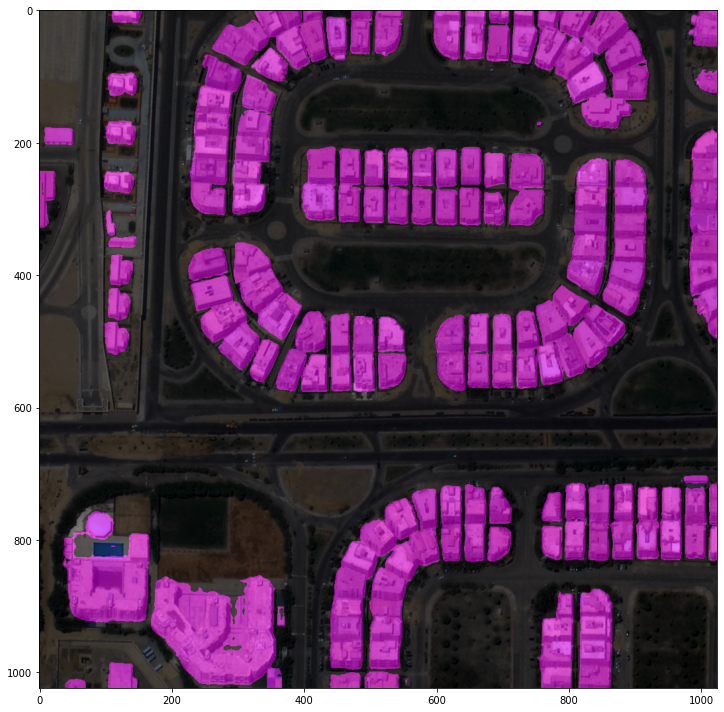

In [ ]:
model.cfg = cfg

img = mmcv.imread('/content/drive/Shareddrives/msmg/level1/dataset/validation/building/image/BLD00007_PS3_K3A_NIA0276.png')
result = inference_segmentor(model, img)
plt.figure(figsize=(10, 10))
show_result_pyplot(model, img, result, palette)

/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


<Figure size 720x720 with 0 Axes>

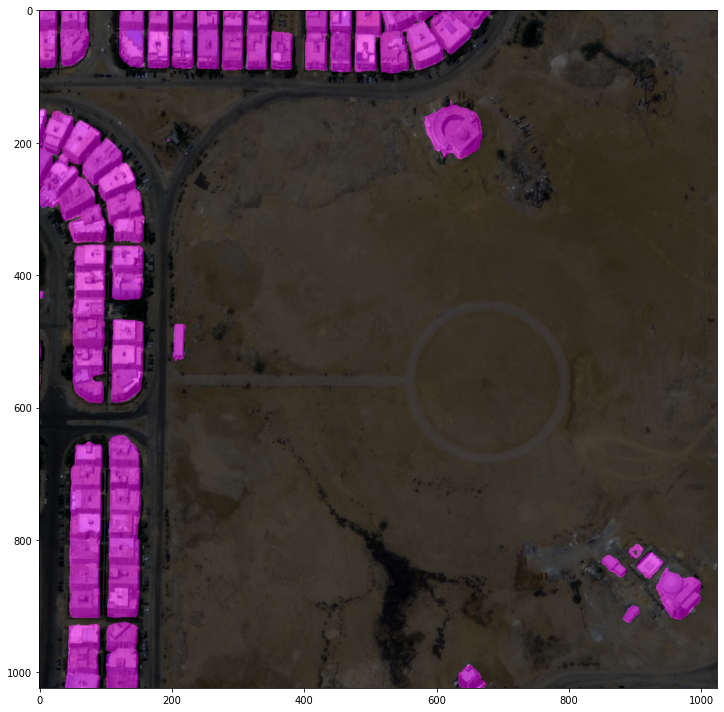

In [ ]:
img = mmcv.imread('/content/drive/Shareddrives/msmg/level1/dataset/validation/building/image/BLD00010_PS3_K3A_NIA0276.png')
result = inference_segmentor(model, img)
plt.figure(figsize=(10, 10))
show_result_pyplot(model, img, result, palette)

/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


<Figure size 720x720 with 0 Axes>

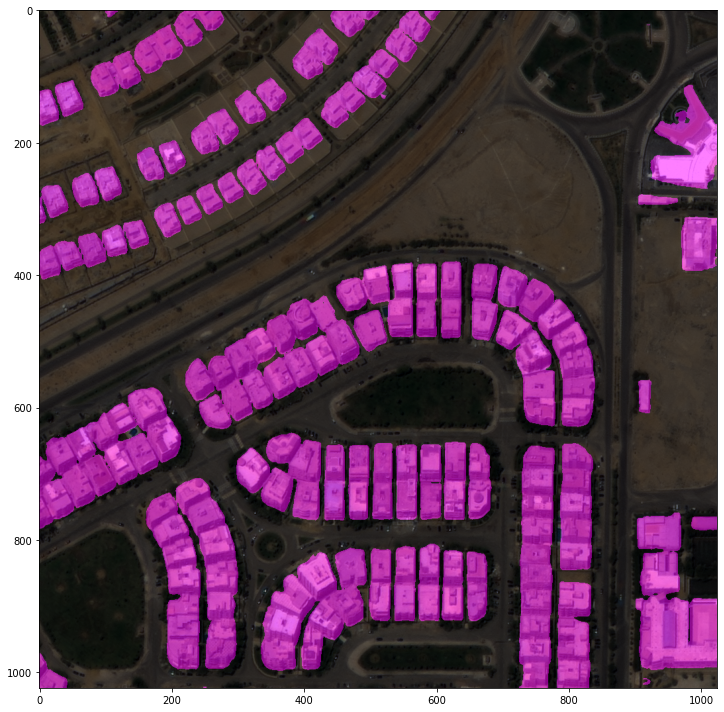

In [ ]:
img = mmcv.imread('/content/drive/Shareddrives/msmg/level1/dataset/validation/building/image/BLD00031_PS3_K3A_NIA0276.png')
result = inference_segmentor(model, img)
plt.figure(figsize=(10, 10))
show_result_pyplot(model, img, result, palette)

/content/mmsegmentation/mmseg/models/backbones/hrnet.py:318: UserWarning: DeprecationWarning: pretrained is deprecated, please use "init_cfg" instead
  warnings.warn('DeprecationWarning: pretrained is deprecated, '
/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/Shareddrives/msmg/level1/source/building/hrnet/hrnetv2p-w48/no2_iter10000_checkpoint/iter_10000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


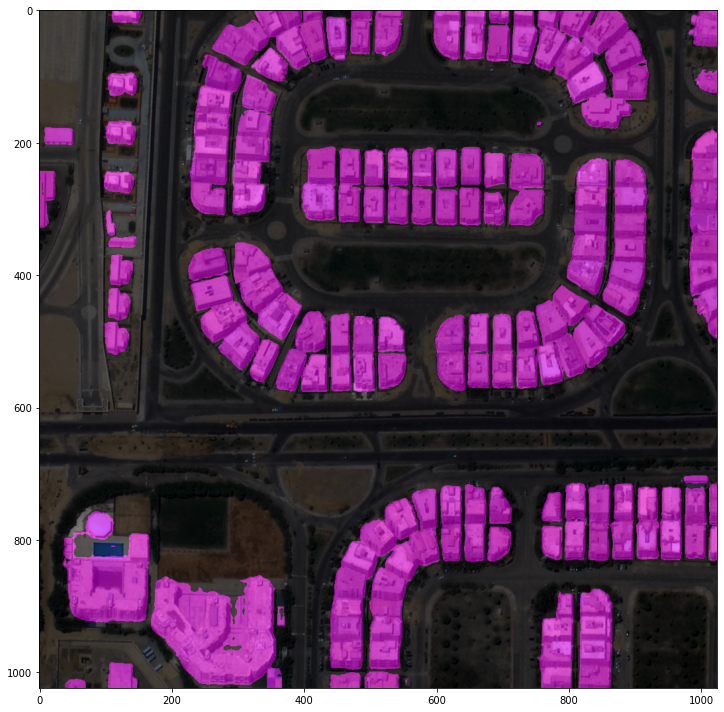

In [ ]:
checkpoint_file = '/content/drive/Shareddrives/msmg/loss test/bjh/building_hrnet_no4_iter10000_checkpoint/iter_10000.pth'  # 학습된 가중치 파일

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/Shareddrives/msmg/level1/dataset/validation/building/image/BLD00007_PS3_K3A_NIA0276.png') # inference할 이미지
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

# Inference and evaluation on the test dataset

In [ ]:
import torch, torchvision

import mmseg
from mmseg.apis import inference_segmentor, init_segmentor, show_result_pyplot
from mmseg.core.evaluation import get_palette
from mmseg.datasets.builder import DATASETS
from mmseg.datasets.custom import CustomDataset
from mmseg.apis import set_random_seed

import mmcv
from mmcv import Config

import matplotlib.pyplot as plt
import os.path as osp
import numpy as np
from PIL import Image

In [ ]:
# convert dataset annotation to semantic segmentation map
data_root = '/content/drive/Shareddrives/msmg/level1/upsampling/upsampled_car/train/building_crop16'
img_dir = 'image'
ann_dir = 'annotation'

# define class and plaette for better visualization
classes = ('background', 'building')
palette = [[0, 0, 0], [0, 0, 255]]

In [ ]:
config_file = '/content/mmsegmentation/configs/hrnet/fcn_hr48_512x512_160k_ade20k.py'
checkpoint_file = '/content/mmsegmentation/checkpoints/fcn_hr48_512x512_160k_ade20k_20200614_214407-a52fc02c.pth'
save_pth_path = '/content/drive/Shareddrives/msmg/level1/upsampling/upsampled_car/hrnet/building/no1_building_upsample_iter15000_ce+lovasz_albu_checkpoint'

In [ ]:
from mmseg.datasets.builder import DATASETS
from mmseg.datasets.custom import CustomDataset

@DATASETS.register_module(force=True)
class BuildingSemanticSegmentation(CustomDataset):
    CLASSES = classes
    PALETTE = palette
    def __init__(self, split, **kwargs):
        super().__init__(img_suffix='.png', seg_map_suffix='.png', split=split, **kwargs)
        assert osp.exists(self.img_dir) and self.split is not None

In [ ]:
from mmcv import Config

cfg = Config.fromfile(config_file)

In [ ]:
from mmseg.apis import set_random_seed

# add CLASSES and PALETTE to checkpoint
cfg.checkpoint_config.meta = dict(
    CLASSES=classes,
    PALETTE=palette)

# Since we use only one GPU, BN is used instead of SyncBN
cfg.norm_cfg = dict(type='BN', requires_grad=True)
#cfg.model.backbone.norm_cfg = cfg.norm_cfg
cfg.model.decode_head.norm_cfg = cfg.norm_cfg
cfg.model.backbone.norm_cfg = cfg.norm_cfg

# modify num classes of the model in decode/auxiliary head
cfg.model.decode_head.num_classes = 2

# modify loss function crossentropy
cfg.model.decode_head.loss_decode= [
    dict(type='CrossEntropyLoss', class_weight=[0.5, 1.0], loss_name='loss_ce', loss_weight=0.8),
	dict(type='LovaszLoss', loss_type='multi_class', classes='all', per_image=True, reduction='mean', class_weight=[0.5, 1.0], loss_name='loss_lovasz', loss_weight=0.2)
]

# Modify dataset type and path
cfg.dataset_type = 'BuildingSemanticSegmentation'
cfg.data_root = data_root

cfg.data.samples_per_gpu = 8
cfg.data.workers_per_gpu = 8

# Albumentations transforms settings
albu_train_transforms = [
    dict(
    type='OneOf',
    transforms=[
        dict(type='RandomRotate90', p=1.0)
    ], p=0.5),

    dict(
    type='OneOf',
    transforms=[
        dict(type='RandomBrightnessContrast',brightness_limit=0.1, contrast_limit=0.15, p=1.0),
        dict(type='CLAHE', clip_limit=4.0, tile_grid_size=(8, 8), always_apply=False, p=1.0),
        dict(type='HueSaturationValue', hue_shift_limit=15, sat_shift_limit=25, val_shift_limit=10, p=1.0),
    ], p=0.5)
]

# pipline
cfg.img_norm_cfg = dict(
    mean=[123.675, 116.28, 103.53], std=[58.395, 57.12, 57.375], to_rgb=True)
cfg.crop_size = (512, 512)
cfg.train_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations'),
    dict(type='Resize', img_scale=(512, 512), ratio_range=(1.0, 1.2)),
    dict(type='RandomCrop', crop_size=cfg.crop_size),
    dict(type='RandomFlip', flip_ratio=0.5),
    dict(
        type='Albu',
        transforms=albu_train_transforms,
        keymap=dict(img='image', gt_semantic_seg='mask'),
        update_pad_shape=True,
        ),
    dict(type='PhotoMetricDistortion'),
    dict(type='Normalize', **cfg.img_norm_cfg),
    dict(type='Pad', size=cfg.crop_size, pad_val=0, seg_pad_val=255),
    dict(type='DefaultFormatBundle'),
    dict(type='Collect', keys=['img', 'gt_semantic_seg']),
]

cfg.test_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(
        type='MultiScaleFlipAug',
        img_scale=(512, 512),
        # img_ratios=[0.5, 0.75, 1.0, 1.25, 1.5, 1.75],
        flip=False,
        transforms=[
            dict(type='Resize', keep_ratio=True),
            dict(type='RandomFlip'),
            dict(type='Normalize', **cfg.img_norm_cfg),
            dict(type='ImageToTensor', keys=['img']),
            dict(type='Collect', keys=['img']),
        ])
]

cfg.data.train.type = cfg.dataset_type
cfg.data.train.data_root = '/content/drive/Shareddrives/msmg/level1/upsampling/upsampled_car/train/building_crop16/'
cfg.data.train.img_dir = 'image'
cfg.data.train.ann_dir = 'annotation'
cfg.data.train.pipeline = cfg.train_pipeline
cfg.data.train.split = 'split/train.txt'

cfg.data.val.type = cfg.dataset_type
cfg.data.val.data_root = '/content/drive/Shareddrives/msmg/level1/upsampling/upsampled_car/validation/building_crop16/'
cfg.data.val.img_dir = 'image'
cfg.data.val.ann_dir = 'annotation'
cfg.data.val.pipeline = cfg.test_pipeline
cfg.data.val.split = 'split/validation200.txt'

cfg.data.test.type = cfg.dataset_type
cfg.data.test.data_root = '/content/drive/Shareddrives/msmg/level1/upsampling/upsampled_car/validation/building_crop16/'
cfg.data.test.img_dir = 'image'
cfg.data.test.ann_dir = 'annotation'
cfg.data.test.pipeline = cfg.test_pipeline
cfg.data.test.split = 'split/validation.txt'

# We can still use the pre-trained Mask RCNN model though we do not need to
# use the mask branch
cfg.load_from = checkpoint_file

# Set up working dir to save files and logs.
cfg.work_dir = save_pth_path

cfg.runner.max_iters = 15000
cfg.log_config.interval = 10
cfg.evaluation.interval = 100
cfg.evaluation.save_best = 'mIoU'
cfg.checkpoint_config.interval = 2000

# Set seed to facitate reproducing the result
cfg.seed = 0
set_random_seed(0, deterministic=False)
cfg.gpu_ids = range(1)

# We can also use tensorboard to log the training process
cfg.log_config.hooks = [
    dict(type='TextLoggerHook'),
    dict(type='TensorboardLoggerHook')]

# Let's have a look at the final config used for training
print(f'Config:\n{cfg.pretty_text}')

Config:
norm_cfg = dict(type='BN', requires_grad=True)
model = dict(
    type='EncoderDecoder',
    pretrained='open-mmlab://msra/hrnetv2_w48',
    backbone=dict(
        type='HRNet',
        norm_cfg=dict(type='BN', requires_grad=True),
        norm_eval=False,
        extra=dict(
            stage1=dict(
                num_modules=1,
                num_branches=1,
                block='BOTTLENECK',
                num_blocks=(4, ),
                num_channels=(64, )),
            stage2=dict(
                num_modules=1,
                num_branches=2,
                block='BASIC',
                num_blocks=(4, 4),
                num_channels=(48, 96)),
            stage3=dict(
                num_modules=4,
                num_branches=3,
                block='BASIC',
                num_blocks=(4, 4, 4),
                num_channels=(48, 96, 192)),
            stage4=dict(
                num_modules=3,
                num_branches=4,
                block='BASIC',
     

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/Shareddrives/msmg/level1/upsampling/upsampled_car/hrnet/building/no1_building_upsample_iter15000_ce+lovasz_albu_checkpoint/best_mIoU_iter_14900.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


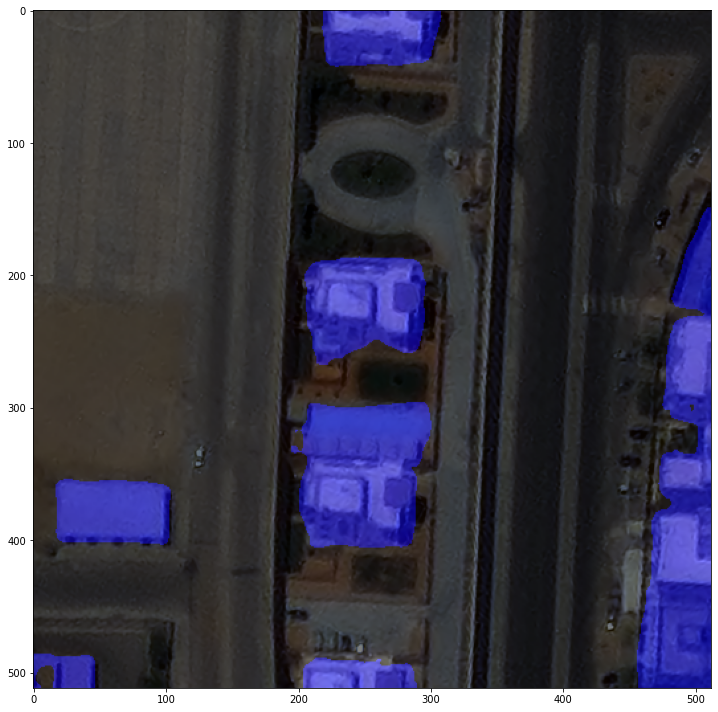

In [ ]:
checkpoint_file = '/content/drive/Shareddrives/msmg/level1/upsampling/upsampled_car/hrnet/building/no1_building_upsample_iter15000_ce+lovasz_albu_checkpoint/best_mIoU_iter_14900.pth'  # 학습된 가중치 파일

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/Shareddrives/msmg/level1/upsampling/upsampled_car/validation/building_crop16/image/BLD00007_PS3_K3A_NIA0276_x2_00.png') # inference할 이미지
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

In [ ]:
from mmseg.datasets import (build_dataloader, build_dataset)

# test용 Dataset과 DataLoader 생성. 
# build_dataset()호출 시 list로 감싸지 않는 것이 train용 dataset 생성시와 차이. 
dataset = build_dataset(cfg.data.test)
data_loader = build_dataloader(
        dataset,
        # 반드시 아래 samples_per_gpu 인자값은 1로 설정
        #samples_per_gpu=cfg.data.samples_per_gpu,
        #workers_per_gpu=cfg.data.workers_per_gpu,
        samples_per_gpu=1,
        workers_per_gpu=1,
        dist=False,
        shuffle=False)

2022-06-06 09:33:30,400 - mmseg - INFO - Loaded 2544 images


In [ ]:
from mmseg.apis import multi_gpu_test, single_gpu_test
from mmcv.parallel import MMDataParallel, MMDistributedDataParallel
#from mmseg.apis import inference_detector, init_detector, show_result_pyplot

model_ckpt = MMDataParallel(model_ckpt, device_ids=[0])

In [ ]:
# single_gpu_test() 를 호출하여 test데이터 세트의 interence 수행. 반드시 batch size는 1이 되어야 함. 
# 위에서 만든 /content/show_test_output 디렉토리에 interence 결과가 시각화된 이미지가 저장됨. 
outputs = single_gpu_test(model_ckpt, data_loader, False, '/content/test3', 0.9)

[                                                  ] 0/2544, elapsed: 0s, ETA:

/content/mmsegmentation/mmseg/apis/test.py:69: UserWarning: DeprecationWarning: ``efficient_test`` will be deprecated, the evaluation is CPU memory friendly with pre_eval=True
  'DeprecationWarning: ``efficient_test`` will be deprecated, the '


[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2544/2544, 3.6 task/s, elapsed: 713s, ETA:     0s

# 반환된 test용 데이터 세트의 inference 적용 결과 확인 및 성능 evaluation 수행 

In [ ]:
metric = dataset.evaluate(outputs, metric='mIoU')
print(metric)

per class results:

+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 92.84 | 95.36 |
|  building  | 81.56 | 92.28 |
+------------+-------+-------+
Summary:

+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 94.56 | 87.2 | 93.82 |
+-------+------+-------+
{'aAcc': 0.9456, 'mIoU': 0.872, 'mAcc': 0.9381999999999999, 'IoU.background': 0.9284, 'IoU.building': 0.8156, 'Acc.background': 0.9536, 'Acc.building': 0.9228000000000001}
